# Smart City Air Quality Analysis

## Problem Definition and Data Collection

### Problem Definition

The goal of this project is to analyze the air quality in a smart city using machine learning classification techniques. The dataset contains various environmental and pollutant indicators, such as PM2.5, NO2, CO, and meteorological factors like Temperature and Humidity, collected from different sensors. The aim is to classify air quality levels and uncover meaningful patterns or correlations. The final objective is to build a classification model (using Gaussian Discriminant Analysis or Naive Bayes) that can predict air quality levels.

### Data Collection

The dataset provided contains the following columns:
- Timestamp: **Date and time of the data collection (YYYY-MM-DD HH:MM:SS)**.
- Sensor_ID: **ID of the sensor that collected the reading in that particular row (Sensor_1, Sensor_2, Sensor_3, Sensor_4,...)**.
- Latitude: **Latitude of the sensor location (float)**.
- Longitude: **Longitude of the sensor location (float)**.
- PM2.5: **Particulate matter 2.5 (float)**. Particulate matter is a complex mixture of solid and liquid particles suspended in the air and is a major component of smog, haze, faulty car emissions, and cigarette smoke. The smaller the particles, the deeper they can penetrate into the respiratory system and the more hazardous they are to human health. PM2.5 refers to particles with a diameter of 2.5 micrometers or less.
- PM10: **Particulate matter 10 (float)**. PM10 refers to particles with a diameter of 10 micrometers or less.
- NO2: **Nitrogen dioxide (float)**. NO2 is a reddish-brown gas with a characteristic sharp, biting odor. It is a prominent air pollutant produced by burning fossil fuels, such as gasoline, diesel, and coal. NO2 can irritate airways in the human respiratory system and can lead to respiratory problems.
- SO2: **Sulfur dioxide (float)**. SO2 is a colorless gas with a pungent odor. It is produced by burning fossil fuels and by certain industrial processes. SO2 can react in the atmosphere to form fine particles and pose a risk to human health.
- CO: **Carbon monoxide (float)**. CO is a colorless, odorless gas produced by burning carbon-based fuels. It is toxic to humans and animals, as it interferes with the blood's ability to carry oxygen to the body's tissues and organs.
- O3: **Ozone (float)**. Ozone is a gas composed of three oxygen atoms. It is a major component of smog and is formed when pollutants emitted by cars, power plants, and other sources react with sunlight. Ground-level ozone can cause respiratory problems and other health issues.
- Temperature: **Temperature in degrees Celsius (float)**.
- Humidity: **Relative humidity in percentage (float)**.
- Wind_Speed: **Wind speed in km/h (float)**.
- Traffic_Density: **Traffic density in vehicles per hour (float)**. Traffic density is a measure of the number of vehicles passing a specific point in a given time period. Vehicles emit pollutants such as CO, NO2, and PM2.5, suggesting a direct correlation between traffic density and air quality.
- Weather_Condition: **Weather condition at the time of data collection (Clear, Cloudy, Rainy, Snowy)**.

In [1]:
%pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
from scipy.stats import anderson
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from numpy.polynomial.polynomial import Polynomial
import geopandas as gpd
from scipy.stats import describe
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf


In [3]:
secondary = pd.read_csv('smart_city_air_quality_data-1.xls')

In [4]:
secondary.head()

,Timestamp,Sensor_ID,Latitude,Longitude,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density,Weather_Condition
0,2024-01-01 00:00:00,Sensor_1,40.548814,-73.208275,64.940791,50.641385,38.469852,15.179810,0.621379,30.611251,20.488669,47.969763,3.423866,152,Clear
1,2024-01-01 01:00:00,Sensor_1,40.548814,-73.208275,47.948417,52.945183,47.933134,7.949892,0.532176,25.783023,14.355246,51.166906,3.450838,450,Clear
2,2024-01-01 02:00:00,Sensor_1,40.548814,-73.208275,53.130677,42.754951,39.038288,9.768690,0.648841,30.563021,19.485035,64.984725,4.566033,368,Foggy
3,2024-01-01 03:00:00,Sensor_1,40.548814,-73.208275,41.459043,39.110391,36.232283,13.998050,0.515557,38.191496,20.384001,51.652994,4.246402,142,Rainy
4,2024-01-01 04:00:00,Sensor_1,40.548814,-73.208275,24.470102,46.339757,52.321195,12.018616,0.605867,38.673423,13.984220,71.032197,6.021685,383,Rainy


In [5]:
secondary.columns.to_list()

['Timestamp',
 'Sensor_ID',
 'Latitude',
 'Longitude',
 'PM2.5',
 'PM10',
 'NO2',
 'SO2',
 'CO',
 'O3',
 'Temperature',
 'Humidity',
 'Wind_Speed',
 'Traffic_Density',
 'Weather_Condition']

In [6]:
secondary.shape

(7200, 15)

## Data Preprocessing

The preprocessing steps include:
1. Checking for missing values. If any, impute them using the mean or median for numerical features and the mode for categorical features.
2. Checking the data types of each column and converting them to the appropriate format, e.g., datetime for timestamps.
3. Scaling the numerical features using an appropriate method, e.g. normalization or standardization, for the distribution of the data.
4. Encoding categorical features using column-appropriate methods, e.g., one-hot encoding for weather conditions, and manual encoding for binary features.

Some features must be excluded from any of the preprocessing steps because preprocessing them would lead to data leakage. For example, scaling the latitude completely alters its meaning. These features are:
- Timestamp
- Latitude
- Longitude

### Imputating Missing Values

In [7]:
secondary.isnull().sum()

Timestamp            0
Sensor_ID            0
Latitude             0
Longitude            0
PM2.5                0
PM10                 0
NO2                  0
SO2                  0
CO                   0
O3                   0
Temperature          0
Humidity             0
Wind_Speed           0
Traffic_Density      0
Weather_Condition    0
dtype: int64

This dataset has no missing values so no further action is required for the imputation step of the preprocessing.

### Data Types Conversion

Column by column, I will determine the appropriate data type for each feature and convert it accordingly if it is not already in the correct format. For example, the 'Timestamp' column should be converted to a datetime format.

In [8]:
cols = secondary.columns.to_list()
cols

['Timestamp',
 'Sensor_ID',
 'Latitude',
 'Longitude',
 'PM2.5',
 'PM10',
 'NO2',
 'SO2',
 'CO',
 'O3',
 'Temperature',
 'Humidity',
 'Wind_Speed',
 'Traffic_Density',
 'Weather_Condition']

In [9]:
for col in cols:
    print(f'{col} : {secondary[col].dtype}')

Timestamp : object
Sensor_ID : object
Latitude : float64
Longitude : float64
PM2.5 : float64
PM10 : float64
NO2 : float64
SO2 : float64
CO : float64
O3 : float64
Temperature : float64
Humidity : float64
Wind_Speed : float64
Traffic_Density : int64
Weather_Condition : object


Timestamp is converted to a DateTime format.

In [10]:
secondary['Timestamp'] = pd.to_datetime(secondary['Timestamp'])
secondary['Timestamp'].dtype

dtype('<M8[ns]')

Every other column appears to be in appropriate data type format already so no further conversion is required in this step.

The columns that must not be further preprocessed are removed and recombined later

In [11]:
untouched_cols = ['Timestamp', 'Latitude', 'Longitude', 'Sensor_ID']
untouched_df = secondary[untouched_cols]
secondary.drop(untouched_cols, axis=1, inplace=True)
secondary.head()

,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density,Weather_Condition
0,64.940791,50.641385,38.469852,15.179810,0.621379,30.611251,20.488669,47.969763,3.423866,152,Clear
1,47.948417,52.945183,47.933134,7.949892,0.532176,25.783023,14.355246,51.166906,3.450838,450,Clear
2,53.130677,42.754951,39.038288,9.768690,0.648841,30.563021,19.485035,64.984725,4.566033,368,Foggy
3,41.459043,39.110391,36.232283,13.998050,0.515557,38.191496,20.384001,51.652994,4.246402,142,Rainy
4,24.470102,46.339757,52.321195,12.018616,0.605867,38.673423,13.984220,71.032197,6.021685,383,Rainy


### Scaling Numerical Features

To determine the appropriate scaling method for the numerical features, I will check the distribution of the data. If the data is normally distributed, I will use standardization; otherwise, I will use normalization.

To check the distribution of the numerical features, I will use a Anderson-Darling test for normality. If the p-value is less than 0.05 (critical value), the data is not normally distributed.

The pseudo code for this step is as follows:

```python
for feature in numerical_features:
    p_value = anderson_test(data[feature])
    if p_value < 0.05:
        scale_feature(data[feature], method='Normalization')
    else:
        scale_feature(data[feature], method='Standardization')
```

Using the wrong scaling method can affect the performance of the machine learning models, e.g. a model could learn the wrong patterns if the data is not scaled correctly.

The first step is to check the distribution of the numerical features using the Anderson-Darling test. A list containing as many 0s as the number of numerical features will be created. If the p-value is less than 0.05, the corresponding element in the list will be set to 1, indicating that the feature is not normally distributed.

In [12]:
numerical_columns = secondary.select_dtypes(include=[np.number]).columns
normality_list = [0] * len(numerical_columns)
num_cols = numerical_columns.to_list()

In [13]:
for i, col in enumerate(numerical_columns):
    result = anderson(secondary[col])
    if result.statistic < result.critical_values[2]:
        normality_list[i] = 1

In [14]:
normality_list

[1, 1, 1, 1, 1, 1, 0, 1, 1, 0]

Juxtaposing the list of numerical features and the list of normality test results (0 or 1) will give us the features that are not normally distributed. These features will be normalized, while the normally distributed features will be standardized.

In [15]:
for i,j in zip(num_cols, normality_list):
    print(f'{i} : {j}')

PM2.5 : 1
PM10 : 1
NO2 : 1
SO2 : 1
CO : 1
O3 : 1
Temperature : 0
Humidity : 1
Wind_Speed : 1
Traffic_Density : 0


The normalization algorithm is given by the formula:

$$X_{norm} = \frac{X - X_{min}}{X_{max} - X_{min}}$$

The standardization algorithm is given by the formula:

$$X_{std} = \frac{X - \mu}{\sigma}$$

where:
- $X$ is the original value of the feature.
- $X_{min}$ is the minimum value of the feature.
- $X_{max}$ is the maximum value of the feature.
- $\mu$ is the mean of the feature.
- $\sigma$ is the standard deviation of the feature.
- $X_{norm}$ is the normalized value of the feature.
- $X_{std}$ is the standardized value of the feature.

In [16]:
for i,j in zip(num_cols, normality_list):
    if j == 1:
        x_min = secondary[i].min()
        x_max = secondary[i].max()
        secondary[i] = (secondary[i] - x_min) / (x_max - x_min)
    else:
        x_mean = secondary[i].mean()
        x_std = secondary[i].std()
        secondary[i] = (secondary[i] - x_mean) / x_std

In [17]:
secondary.head()

,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density,Weather_Condition
0,0.694026,0.334507,0.514684,0.691854,0.667805,0.469299,0.102584,0.356211,0.301326,-0.939097,Clear
1,0.468716,0.355880,0.749944,0.339096,0.553396,0.359365,-1.115883,0.396928,0.303700,1.371338,Clear
2,0.537430,0.261340,0.528815,0.427838,0.703028,0.468201,-0.096799,0.572906,0.401846,0.735581,Foggy
3,0.382670,0.227528,0.459057,0.634194,0.532081,0.641894,0.081790,0.403119,0.373716,-1.016628,Rainy
4,0.157405,0.294598,0.859033,0.537615,0.647910,0.652868,-1.189591,0.649924,0.529954,0.851878,Rainy


In [18]:
secondary.describe()

,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density
count,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000,7.200000e+03,7200.000000,7200.000000,7.200000e+03
mean,0.493877,0.512913,0.554630,0.438364,0.510510,0.456130,3.907985e-16,0.510286,0.438137,1.407516e-16
std,0.130719,0.138563,0.122854,0.146440,0.129276,0.157864,1.000000e+00,0.127378,0.129115,1.000000e+00
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.331345e+00,0.000000,0.000000,-1.729916e+00
25%,0.404022,0.421998,0.472751,0.340071,0.424998,0.347978,-6.629458e-01,0.423408,0.350004,-8.615651e-01
50%,0.492864,0.511102,0.554698,0.438221,0.512417,0.458575,2.978416e-03,0.510301,0.438568,-8.720125e-03
75%,0.582269,0.605264,0.636795,0.537178,0.597428,0.563362,6.884423e-01,0.595777,0.525755,8.751374e-01
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.422207e+00,1.000000,1.000000,1.751242e+00


### Encoding Categorical Features

To determine the appropriate encoding method for the categorical features, I will check the cardinality of each feature. For binary features, I will use manual encoding (0 and 1). Else, I will use one-hot encoding.

However, on evaluating the model (later), the model performs better with OneHot encoding for all categorical features. Therefore, I will use OneHot encoding for all categorical features except the target variable which must be manually encoded so that multiple columns are not created for the target variable.

In [19]:
cat_cols = secondary.select_dtypes(include=[object]).columns
cat_cols

Index(['Weather_Condition'], dtype='object')

In [20]:
secondary[cat_cols].nunique()

Weather_Condition    3
dtype: int64

In [21]:
encoder = OneHotEncoder(drop='first')

In [22]:
target = secondary['Weather_Condition']
cat_cols.drop('Weather_Condition')

Index([], dtype='object')

In [23]:
encoded = encoder.fit_transform(secondary[cat_cols])

In [24]:
secondary.drop(cat_cols, axis=1, inplace=True)

In [25]:
secondary = pd.concat([secondary, pd.DataFrame(encoded.toarray())], axis=1)

In [26]:
secondary.head()

,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density,0,1
0,0.694026,0.334507,0.514684,0.691854,0.667805,0.469299,0.102584,0.356211,0.301326,-0.939097,0.0,0.0
1,0.468716,0.355880,0.749944,0.339096,0.553396,0.359365,-1.115883,0.396928,0.303700,1.371338,0.0,0.0
2,0.537430,0.261340,0.528815,0.427838,0.703028,0.468201,-0.096799,0.572906,0.401846,0.735581,1.0,0.0
3,0.382670,0.227528,0.459057,0.634194,0.532081,0.641894,0.081790,0.403119,0.373716,-1.016628,0.0,1.0
4,0.157405,0.294598,0.859033,0.537615,0.647910,0.652868,-1.189591,0.649924,0.529954,0.851878,0.0,1.0


In [27]:
target.unique()

array(['Clear', 'Foggy', 'Rainy'], dtype=object)

In [28]:
target.head()

0    Clear
1    Clear
2    Foggy
3    Rainy
4    Rainy
Name: Weather_Condition, dtype: object

In [29]:
target = target.map({'Clear': 0, 'Foggy': 1, 'Rainy': 2})

In [30]:
target.head()

0    0
1    0
2    1
3    2
4    2
Name: Weather_Condition, dtype: int64

The untouched columns are recombined with the preprocessed data.

In [31]:
untouched_df = untouched_df.reset_index(drop=True)
target = target.reset_index(drop=True)
secondary = secondary.reset_index(drop=True)
untouched_df = pd.concat([untouched_df, target], axis=1)
secondary = pd.concat([untouched_df, secondary], axis=1)
secondary.head()

,Timestamp,Latitude,Longitude,Sensor_ID,Weather_Condition,PM2.5,PM10,NO2,SO2,CO,O3,Temperature,Humidity,Wind_Speed,Traffic_Density,0,1
0,2024-01-01 00:00:00,40.548814,-73.208275,Sensor_1,0,0.694026,0.334507,0.514684,0.691854,0.667805,0.469299,0.102584,0.356211,0.301326,-0.939097,0.0,0.0
1,2024-01-01 01:00:00,40.548814,-73.208275,Sensor_1,0,0.468716,0.355880,0.749944,0.339096,0.553396,0.359365,-1.115883,0.396928,0.303700,1.371338,0.0,0.0
2,2024-01-01 02:00:00,40.548814,-73.208275,Sensor_1,1,0.537430,0.261340,0.528815,0.427838,0.703028,0.468201,-0.096799,0.572906,0.401846,0.735581,1.0,0.0
3,2024-01-01 03:00:00,40.548814,-73.208275,Sensor_1,2,0.382670,0.227528,0.459057,0.634194,0.532081,0.641894,0.081790,0.403119,0.373716,-1.016628,0.0,1.0
4,2024-01-01 04:00:00,40.548814,-73.208275,Sensor_1,2,0.157405,0.294598,0.859033,0.537615,0.647910,0.652868,-1.189591,0.649924,0.529954,0.851878,0.0,1.0


## Exploratory Data Analysis

Since of the primary goals of this project is to identify correlations and patterns related to time, season, or location and visualize key findings with plots, I will perform the following steps:
1. Extract the year, month, day, and hour from the 'Timestamp' column to analyze trends over time.
2. Plot the distribution of air quality levels and other features to identify patterns.
3. Visualize the correlation matrix to identify relationships between features.
4. Plot the geographical distribution of sensors to identify clusters or patterns based on location.
5. Investigate if factors like Temperature, Humidity, and Wind_Speed are associated with different levels of pollutants.

### Time Series Analysis

In [32]:
secondary['Year'] = secondary['Timestamp'].dt.year
secondary['Month'] = secondary['Timestamp'].dt.month
secondary['Day'] = secondary['Timestamp'].dt.day
secondary['Hour'] = secondary['Timestamp'].dt.hour
secondary['Minute'] = secondary['Timestamp'].dt.minute
secondary['Day_Hour'] = secondary['Day'] * 24 + secondary['Hour']

In [33]:
print(secondary['Year'].unique())
print(secondary['Month'].unique())
print(secondary['Day'].unique())
print(secondary['Hour'].unique())
print(secondary['Minute'].unique())

[2024]
[1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
[0]


From the figures above, it appears that the data collection is only for January 2024, and the data is collected every hour. For each sensor, and for each pollutant, plots are generated to show the trends over time. The plots show the variation in pollutant levels over the month of January 2024.

In [34]:
pollutants = ['CO', 'NO2', 'O3', 'PM10', 'PM2.5', 'SO2']
sensors = secondary['Sensor_ID'].unique().tolist()

In [35]:
sensors

['Sensor_1',
 'Sensor_2',
 'Sensor_3',
 'Sensor_4',
 'Sensor_5',
 'Sensor_6',
 'Sensor_7',
 'Sensor_8',
 'Sensor_9',
 'Sensor_10']

In [36]:
pollutants

['CO', 'NO2', 'O3', 'PM10', 'PM2.5', 'SO2']

In [37]:
colors = sns.color_palette("husl", len(pollutants))

The original intention was to analyse trends over time for every sensor for every pollutant. However, because there are 10 sensors reproting data and 6 pollutants, this would result in 60 plots. This is a lot plots to analyse and interpret. As such, I have attempted to create summary plots for each polutant and sensor.

The first set of plots show the trends for each pollutant for each sensor. The main aim of these plots is to identify any patterns or trends in the data using a polynomial regression line because the individual data points are too noisy to interpret. A polynomial regression line is fitted to the data to show the overall trend. It is of degree 10, arrived at by trial and error to get the best fit for the data.

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\34370245.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 8))


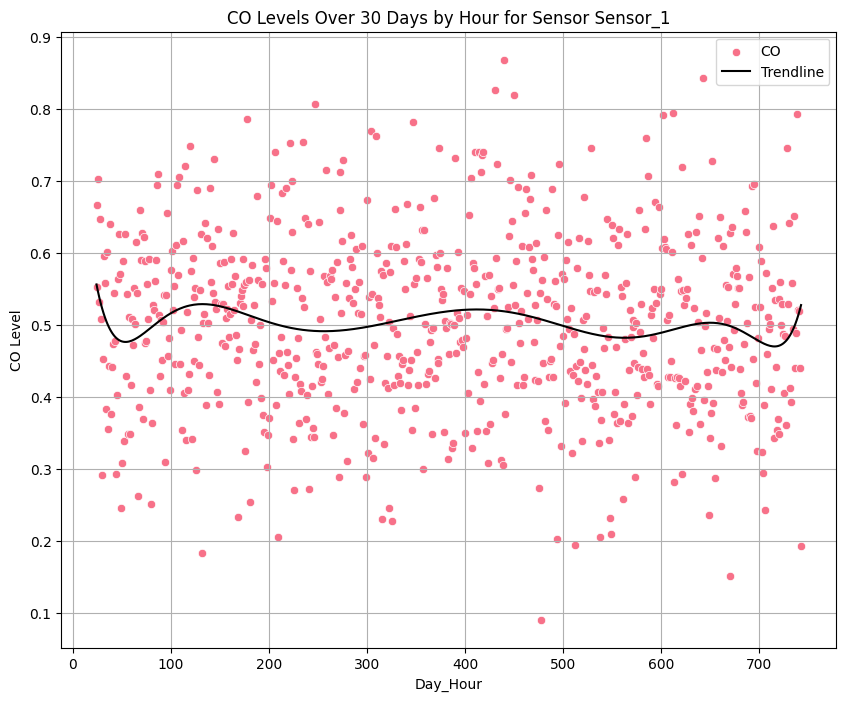

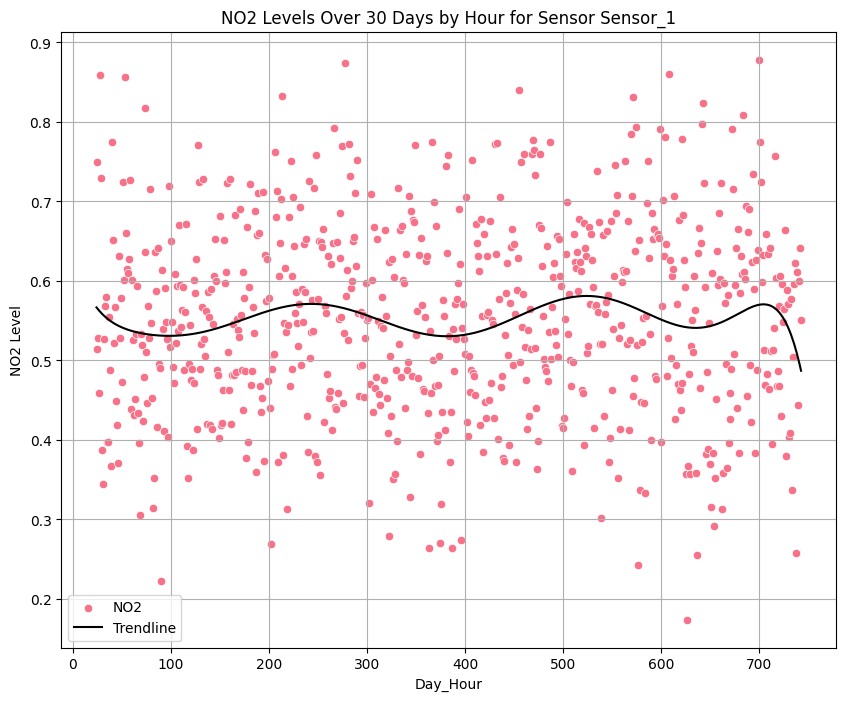

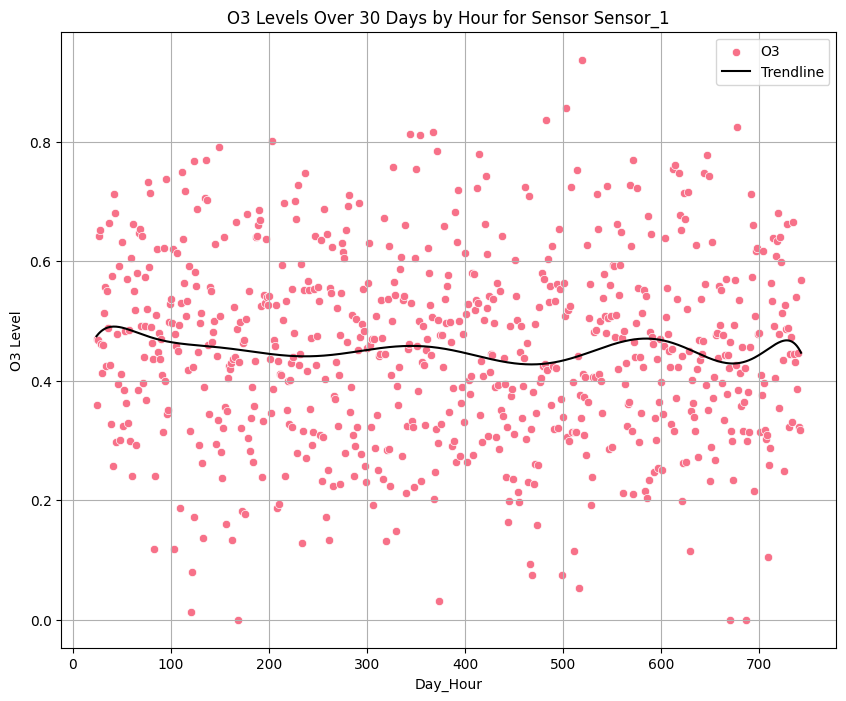

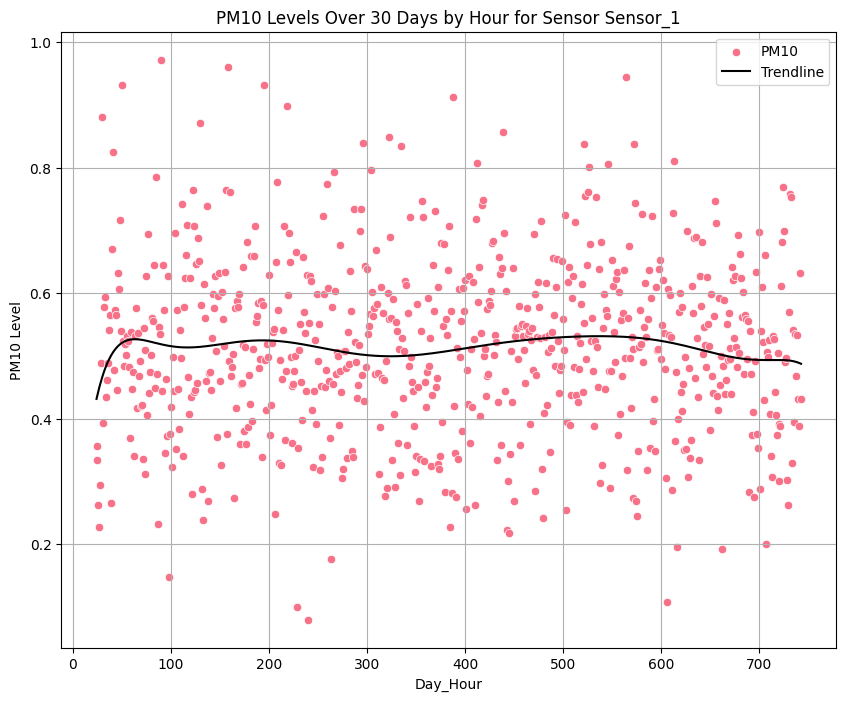

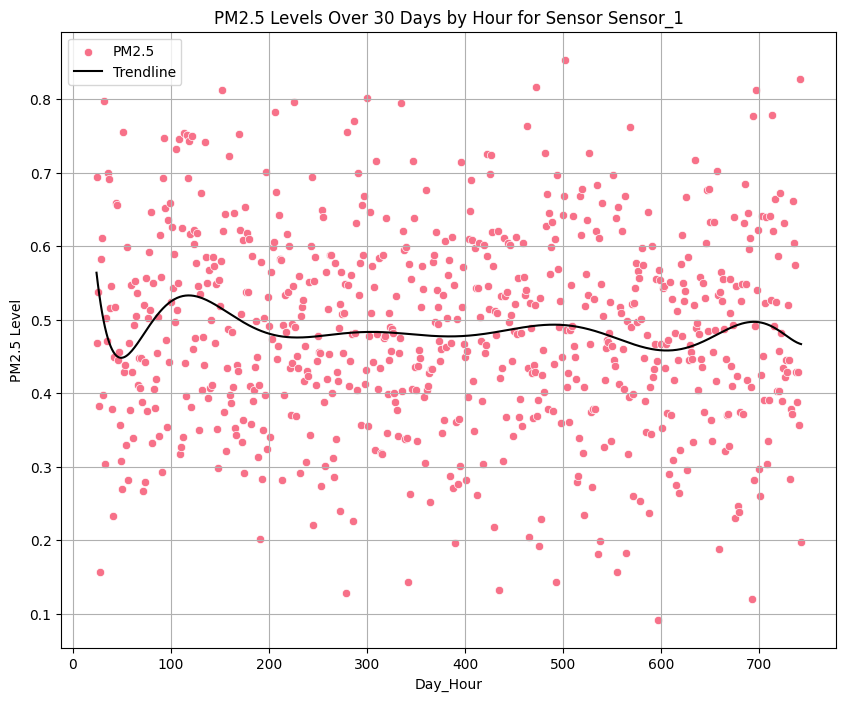

...

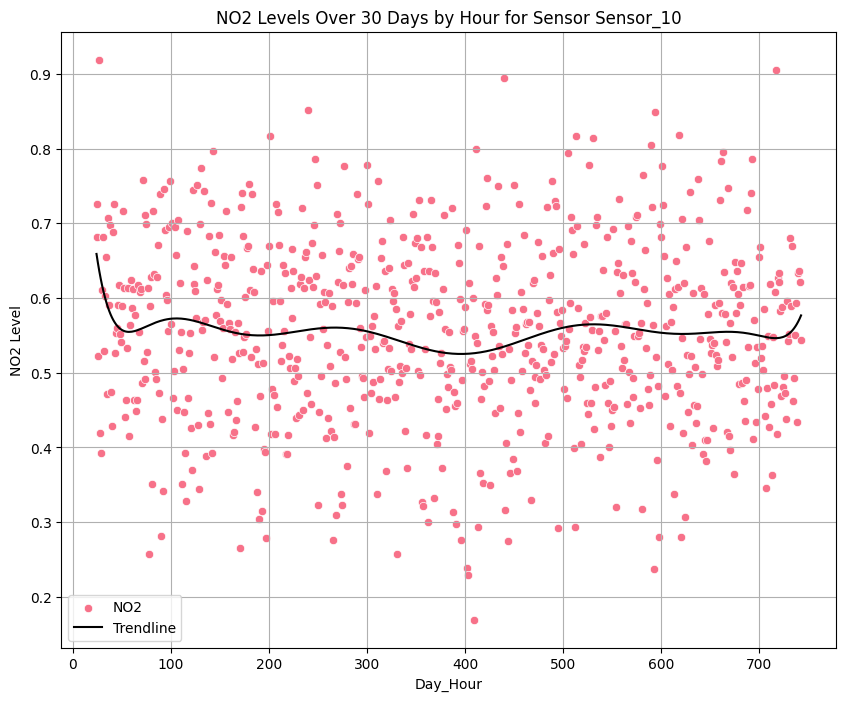

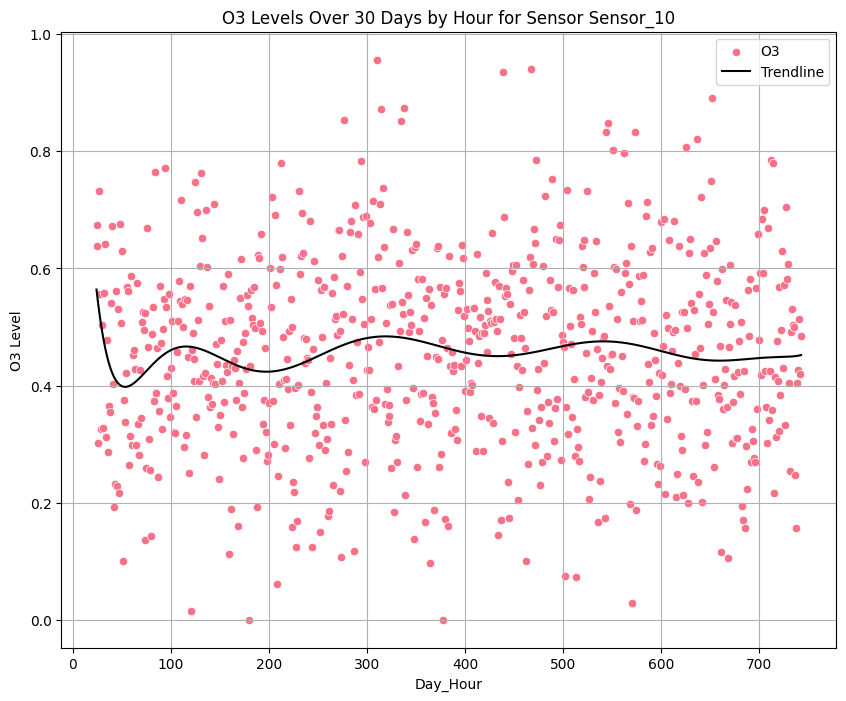

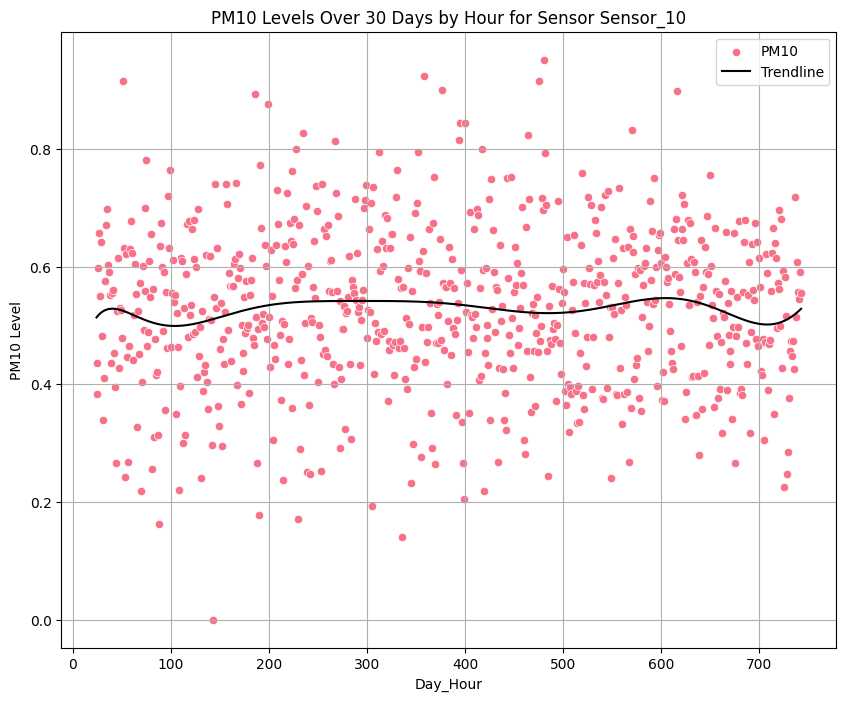

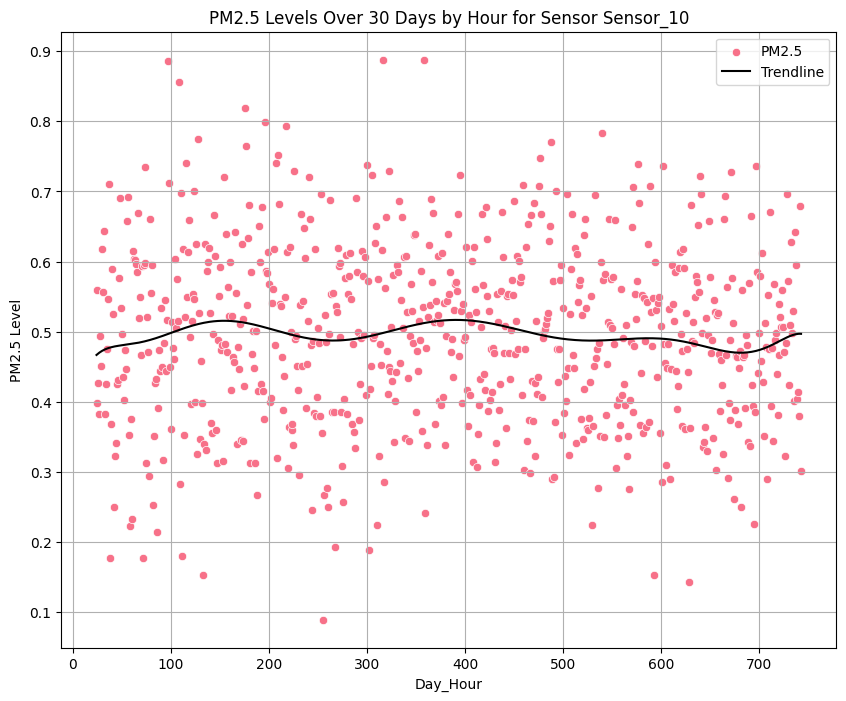

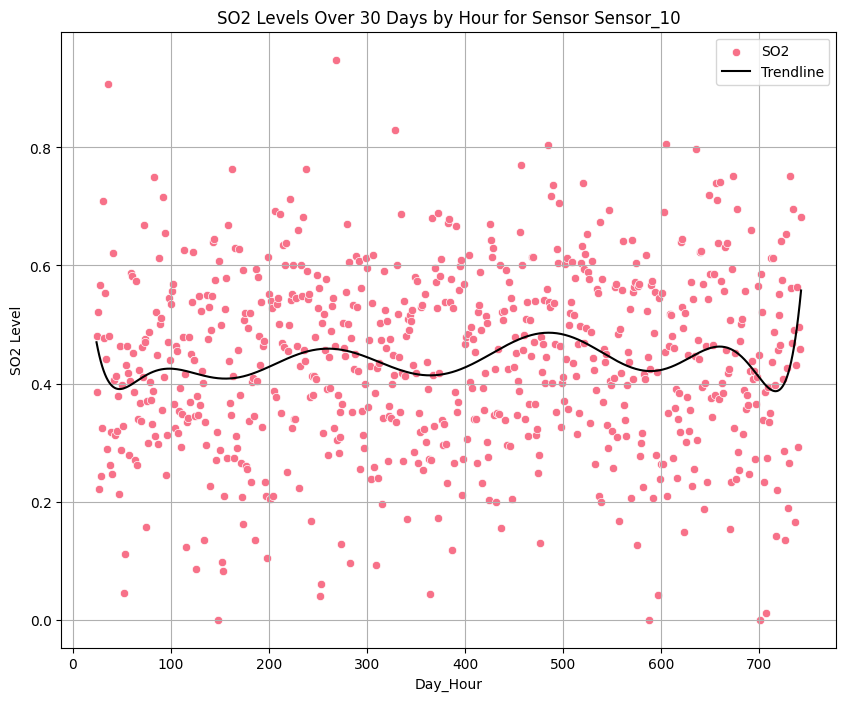

In [38]:
for sensor in sensors:
    sensor_data = secondary[secondary['Sensor_ID'] == sensor]
    for i, pollutant in enumerate(pollutants):
            plt.figure(figsize=(10, 8))
            sns.scatterplot(x='Day_Hour', y=pollutant, data=sensor_data, label=pollutant, color=colors[int(colors[i][-1])])
            p = Polynomial.fit(sensor_data['Day_Hour'], sensor_data[pollutant], deg=10)
            
            x = np.linspace(sensor_data['Day_Hour'].min(), sensor_data['Day_Hour'].max(), 500)
        
            plt.plot(x, p(x), label='Trendline', color='black')

            plt.title(f'{pollutant} Levels Over 30 Days by Hour for Sensor {sensor}')
            plt.xlabel('Day_Hour')
            plt.ylabel(f'{pollutant} Level')
            plt.legend()
            plt.grid(True)


As noted before, the data is too noisy to interpret. However, the polynomial regression line shows a general trend in the data. For example, the PM2.5 levels for Sensor_1 show a general increase over time, while the PM10 levels for Sensor_1 show a general decrease over time. This information can be used to identify trends in the data and investigate the factors that might be influencing these trends.

But there are 2 issues with this approach:
- The polynomial regression line is not a good fit for the data. The data is too noisy and the polynomial regression line does not capture the true trend in the data. A better approach would be to use a moving average or a rolling window to smooth out the data and identify the true trend.
- The individual plots are too numerous to analyse and interpret. A better approach would be to create even more summarized plots to show the trends for all pollutants for each sensor in a single plot.

The second set of plots show the trends for all pollutants for each sensor. The main aim of these plots is to identify any patterns or trends in the data using a polynomial regression line. A polynomial regression line is fitted to the data to show the overall trend. It is of degree 10, arrived at by trial and error to get the best fit for the data. The individual data points are too noisy to interpret, so the polynomial regression line is used to show the general trend and the points are not shown. This cuts down the number of plots from 60 to 6, making it easier to analyse and interpret the data. At the same time, the lines cross each other and are difficult to interpret. A better approach would be to use a moving average or a rolling window to smooth out the data and identify the true trend.

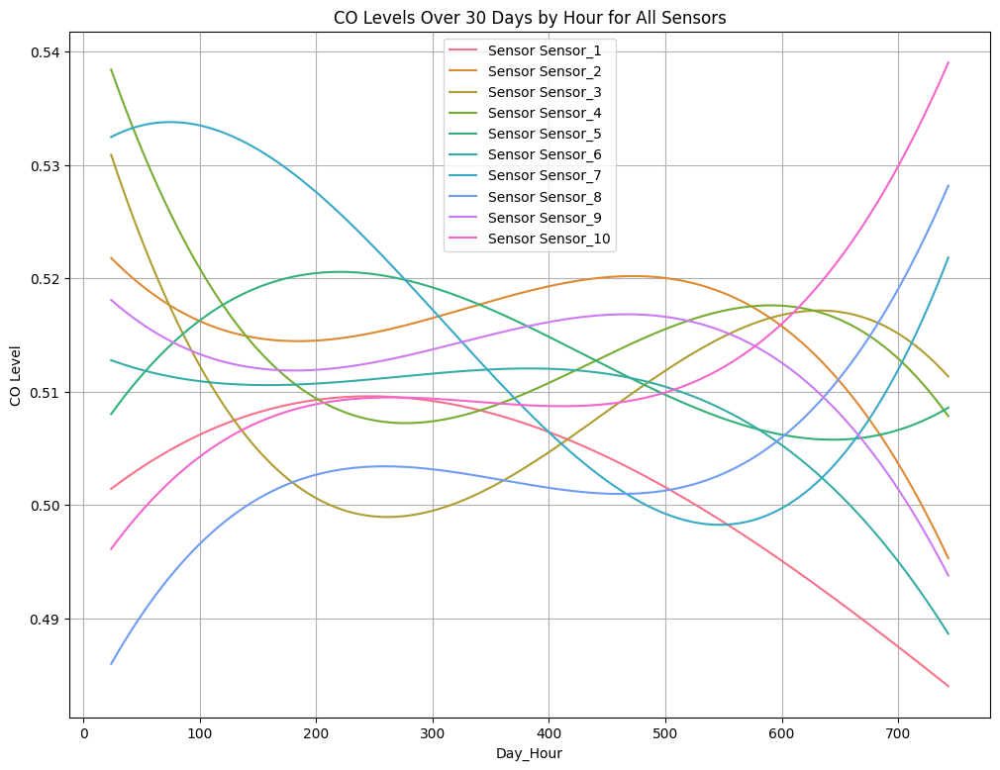

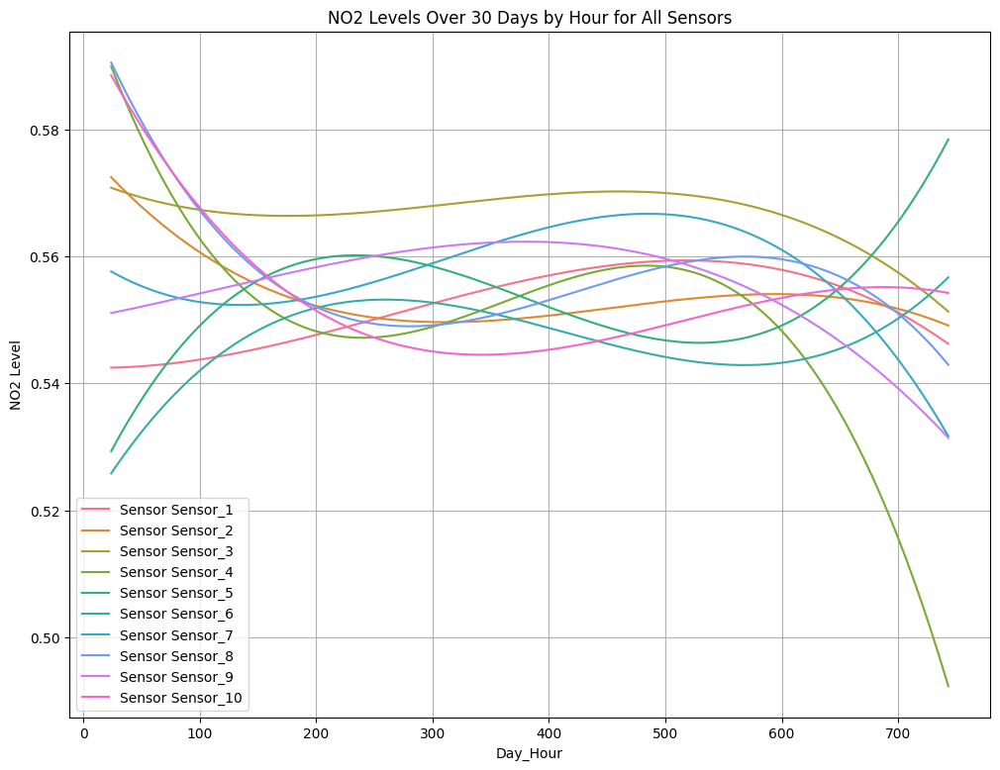

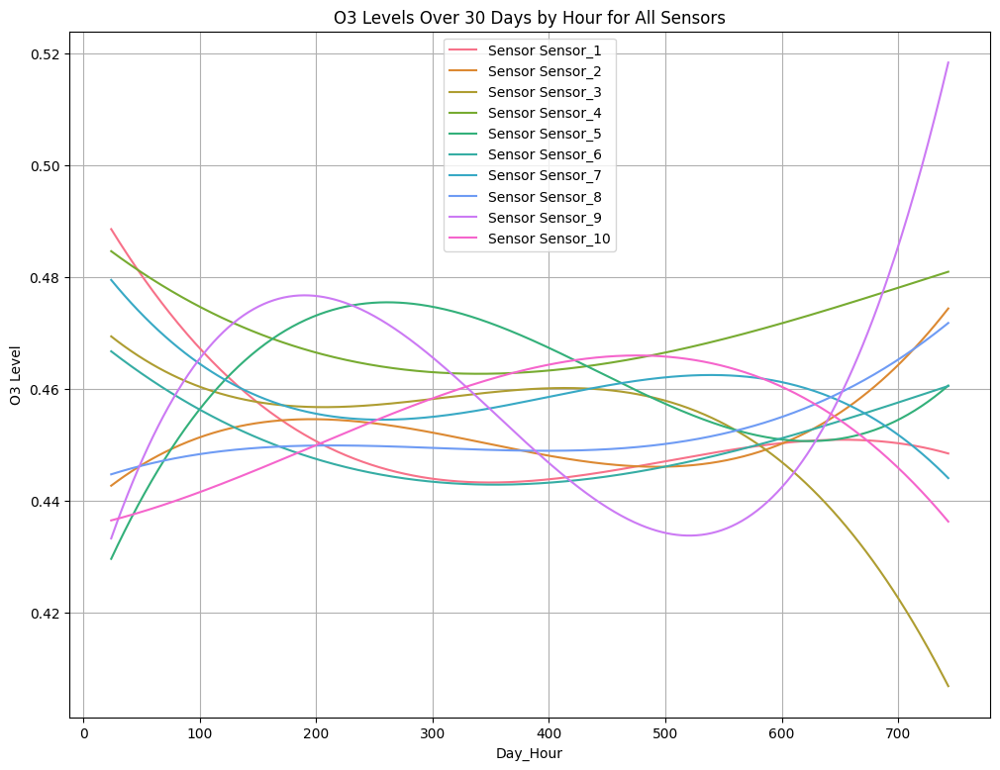

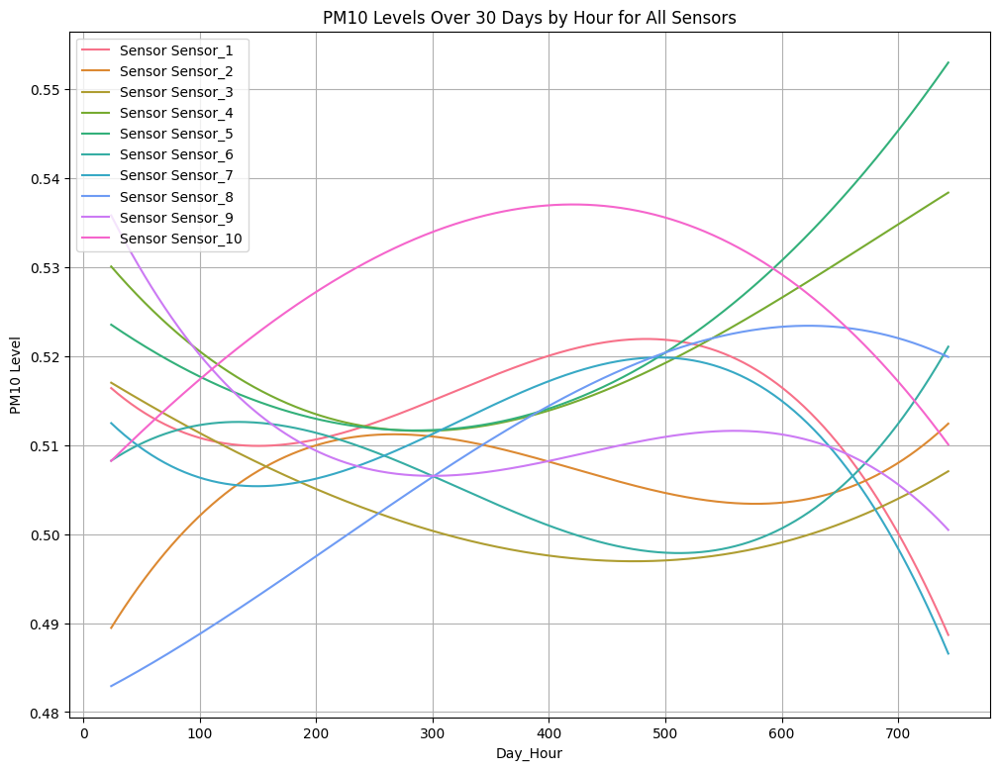

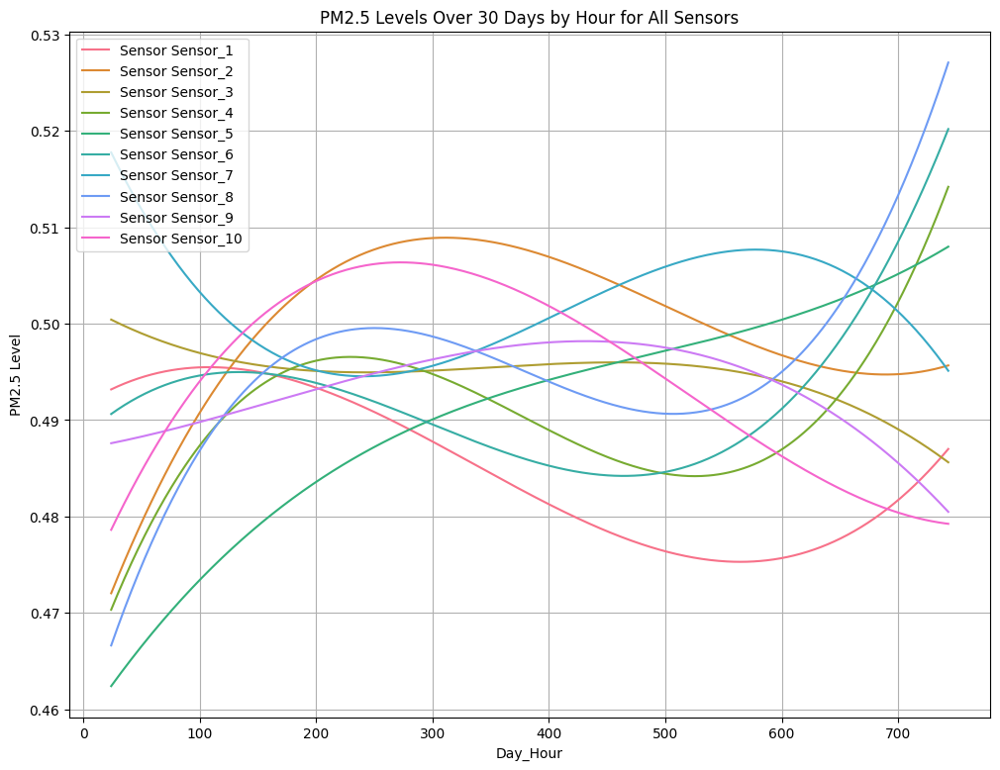

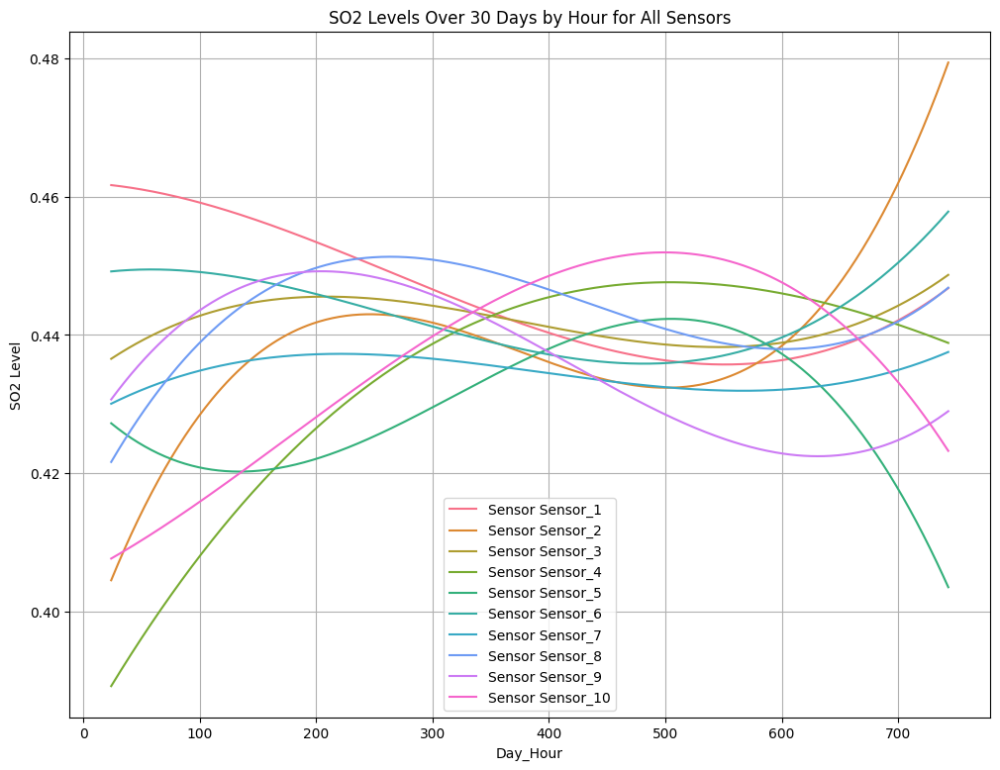

In [39]:
colors = sns.color_palette("husl", len(sensors))

for pollutant in pollutants:
    plt.figure(figsize=(12, 9))
    for i, sensor in enumerate(sensors):
        sensor_data = secondary[secondary['Sensor_ID'] == sensor]
        p = Polynomial.fit(sensor_data['Day_Hour'], sensor_data[pollutant], deg=3)
        x = np.linspace(sensor_data['Day_Hour'].min(), sensor_data['Day_Hour'].max(), 500)
        plt.plot(x, p(x), label=f'Sensor {sensor}', color=colors[i])
    
    plt.title(f'{pollutant} Levels Over 30 Days by Hour for All Sensors')
    plt.xlabel('Day_Hour')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True)
    
    plt.show()

Another idea I attempted was to compute the mean emission of each pollutant for each sensor for each day. This would mean 6 plots, one for each pollutant, showing the mean emission of each pollutant for each sensor for each day. This would give a clearer picture of the trends in the data and make it easier to identify patterns.

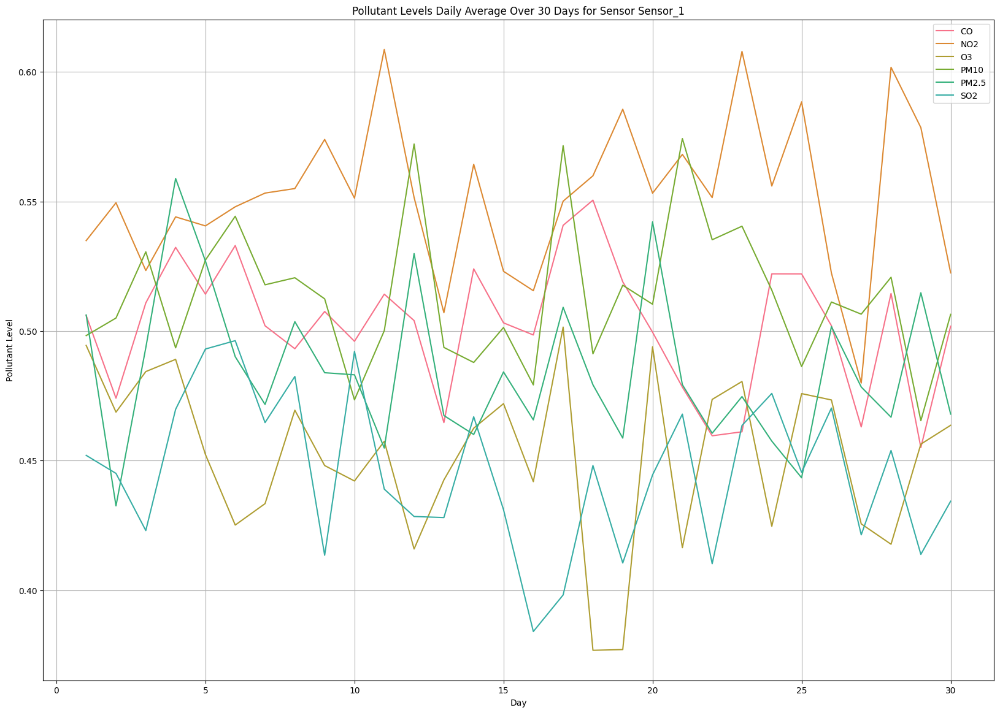

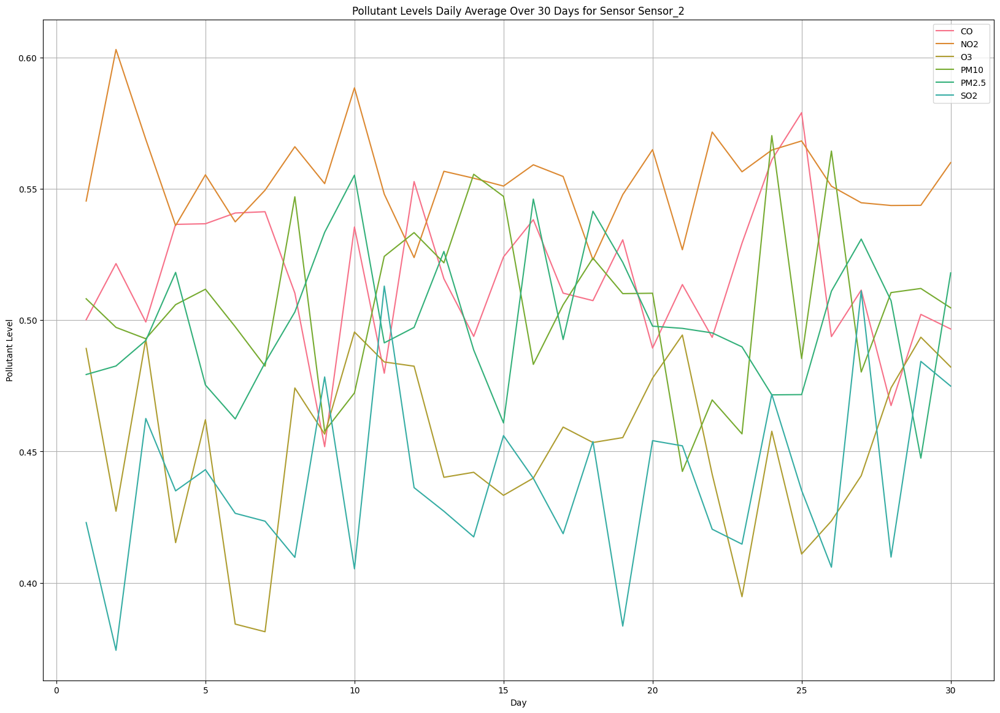

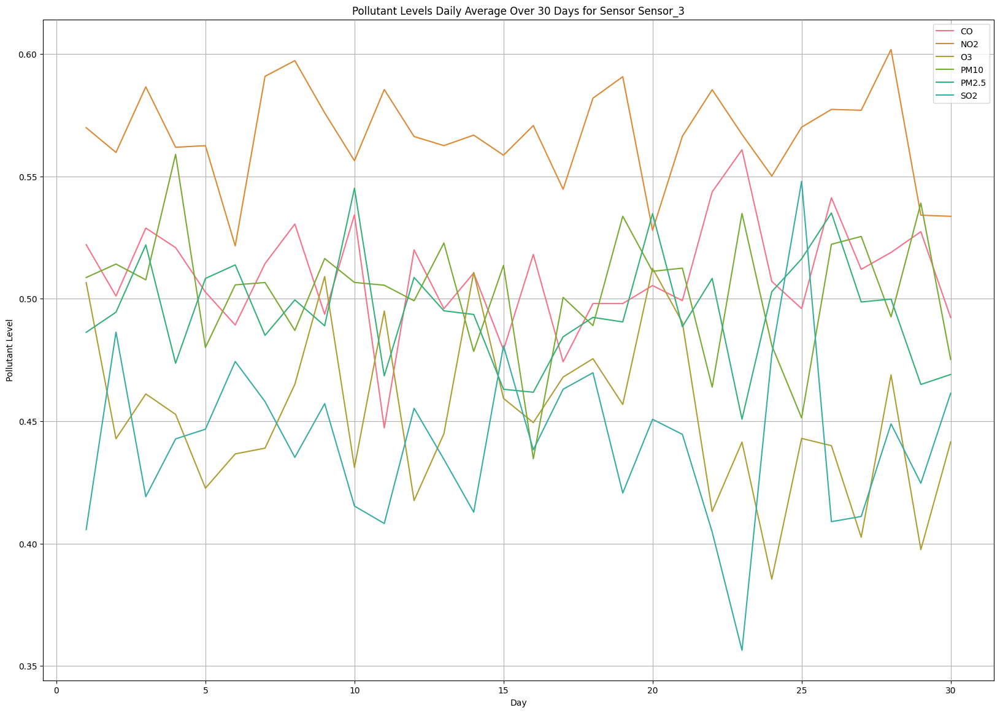

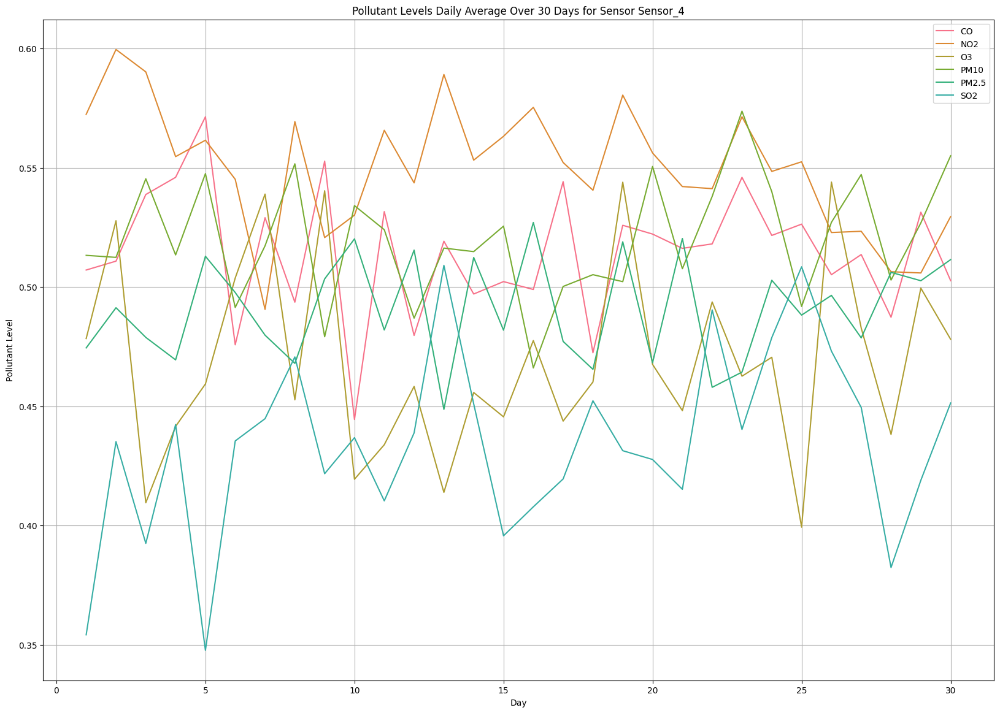

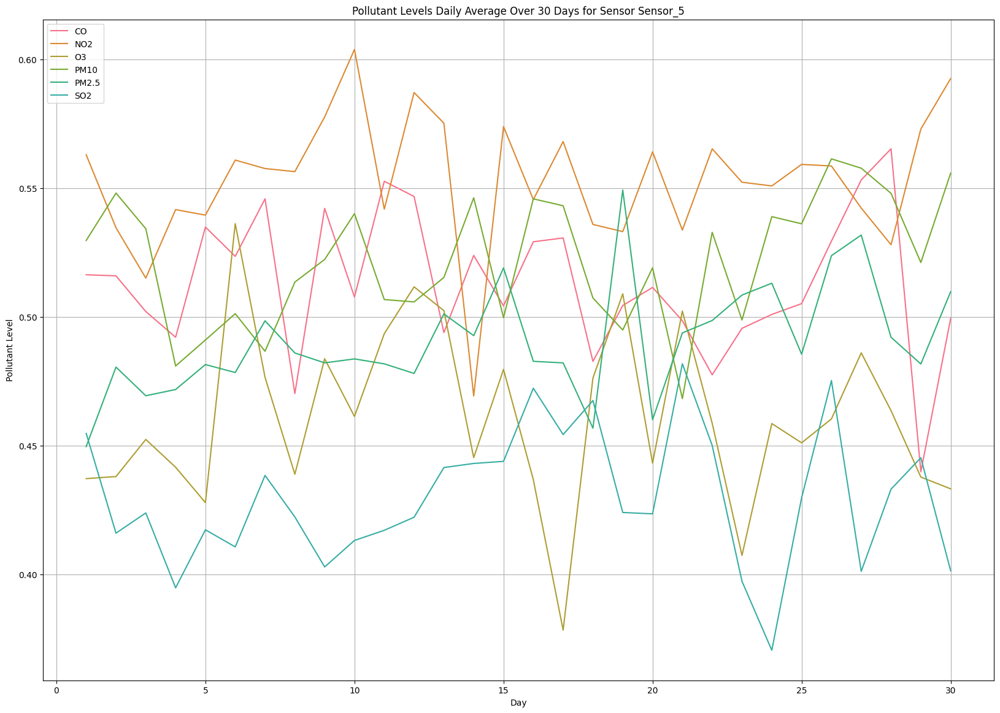

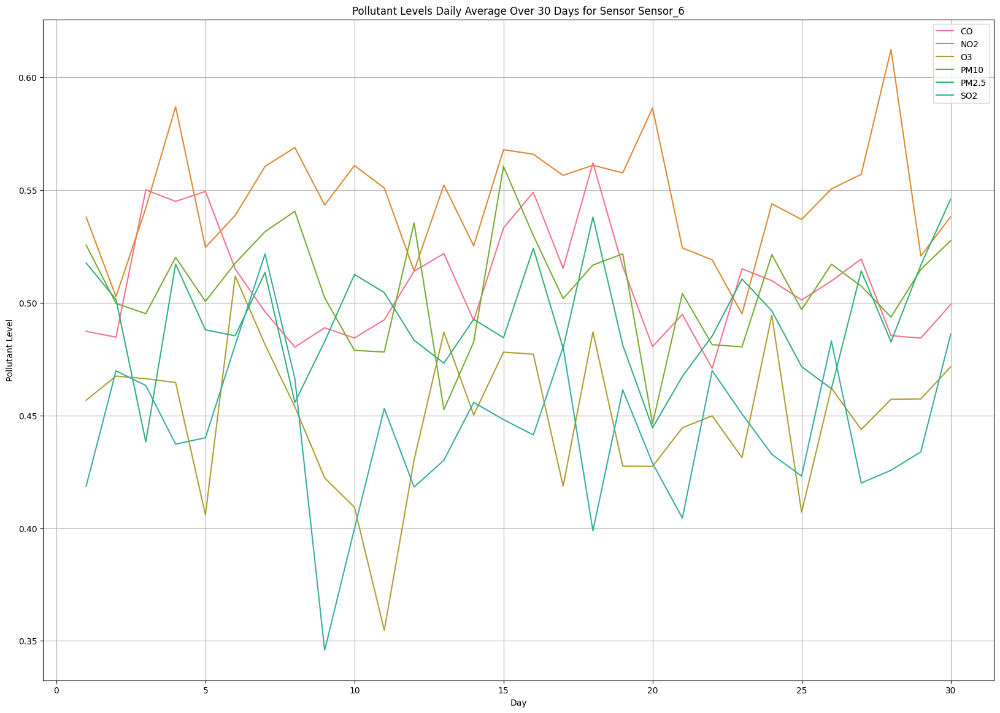

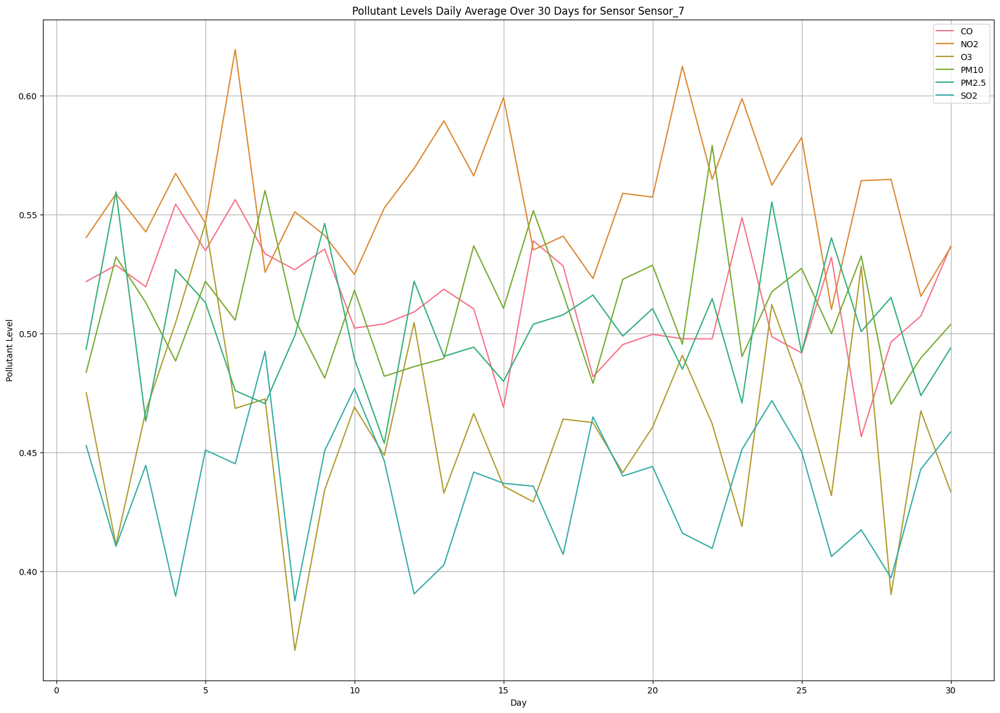

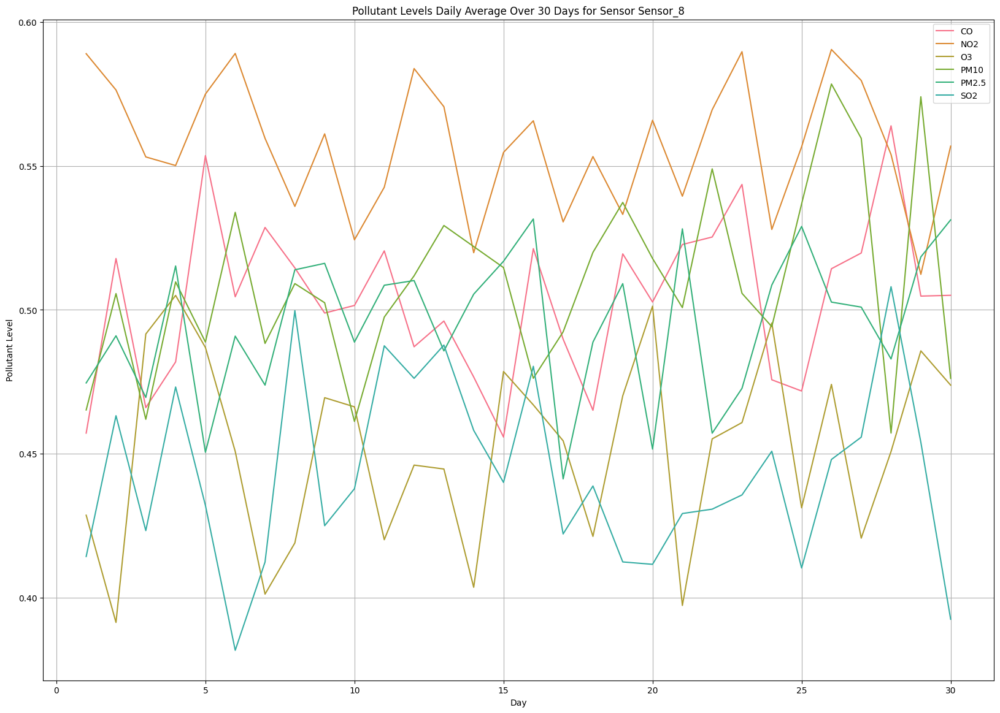

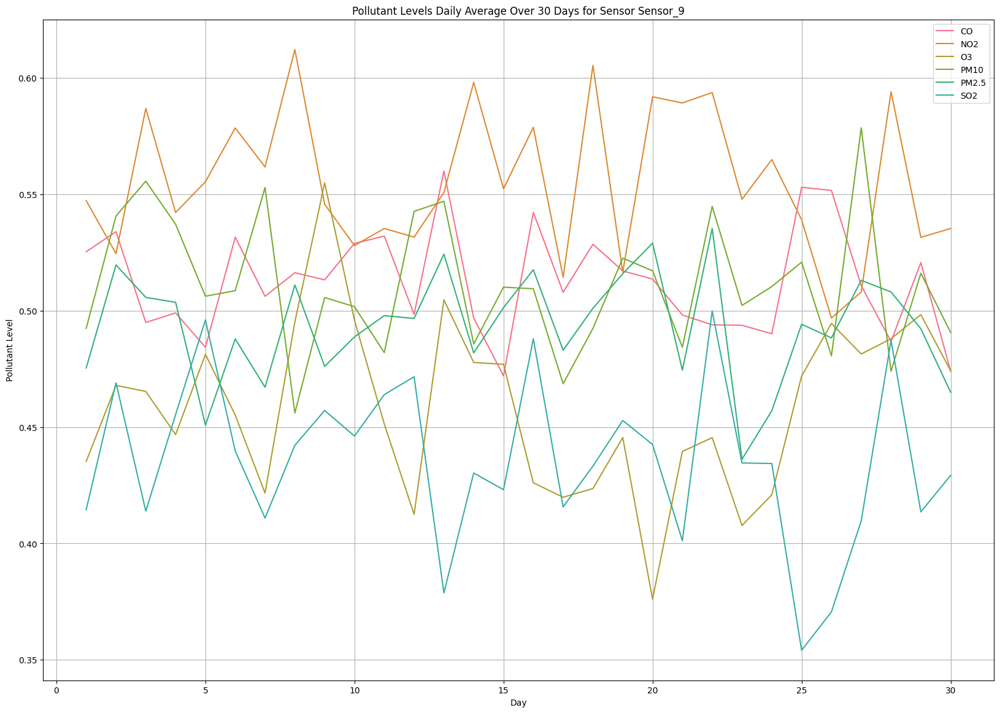

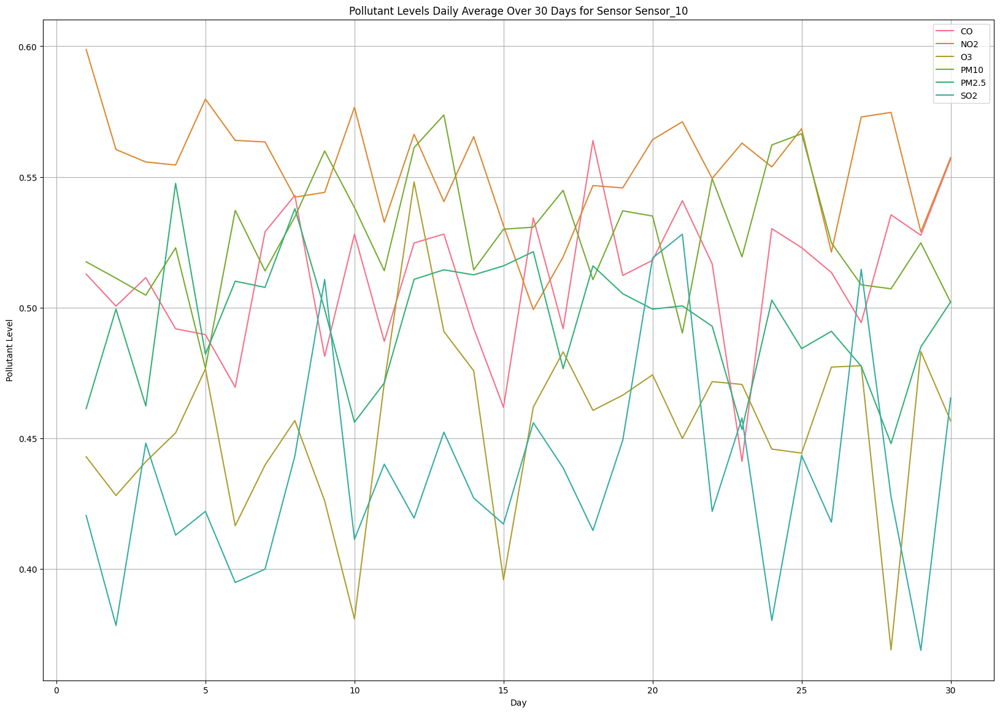

In [40]:
for sensor in sensors:
    sensor_data = secondary[secondary['Sensor_ID'] == sensor]
    plt.figure(figsize=(20, 14))
    for i, pollutant in enumerate(pollutants):
        daily_avg = sensor_data.groupby('Day')[pollutant].mean().reset_index()
        plt.plot(daily_avg['Day'], daily_avg[pollutant], label=pollutant, color=colors[i], linestyle='-')
    plt.title(f'Pollutant Levels Daily Average Over 30 Days for Sensor {sensor}')
    plt.xlabel('Day')
    plt.ylabel('Pollutant Level')
    plt.legend()
    plt.grid(True)
    
    plt.show()

In [41]:
def summarize_data(data, column):
    stats = describe(data[column])
    print(f'Summary statistics for {column}:')
    print(f'Mean: {stats.mean}')
    print(f'Variance: {stats.variance}')
    print(f'Skewness: {stats.skewness}')
    print(f'Kurtosis: {stats.kurtosis}')
    print(f'Min: {stats.minmax[0]}')
    print(f'Max: {stats.minmax[1]}')
    print()

Analyzing CO distribution across all sensors:
Summary statistics for CO:
Mean: 0.5105100377785835
Variance: 0.016712353371454776
Skewness: -0.0569930370988168
Kurtosis: 0.1336640785968095
Min: 0.0
Max: 1.0



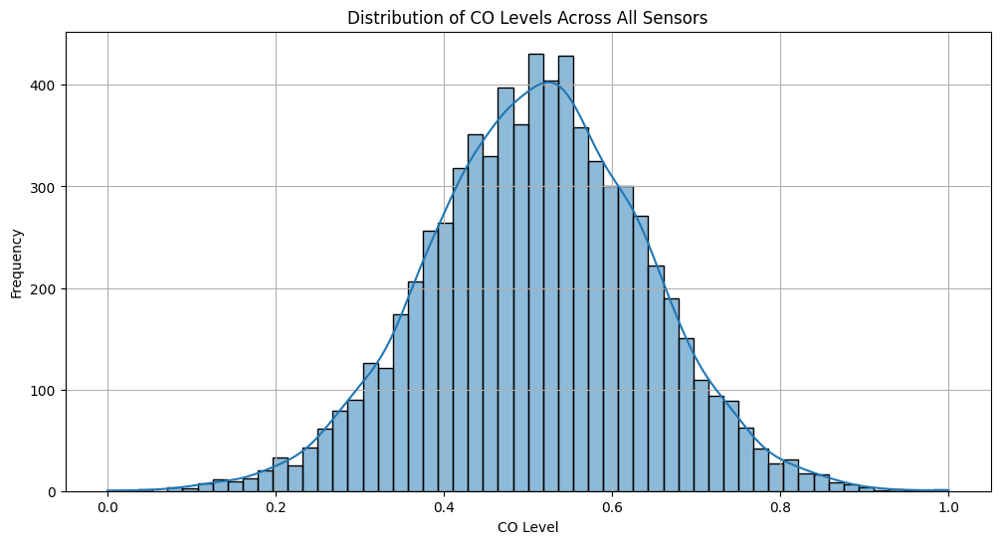

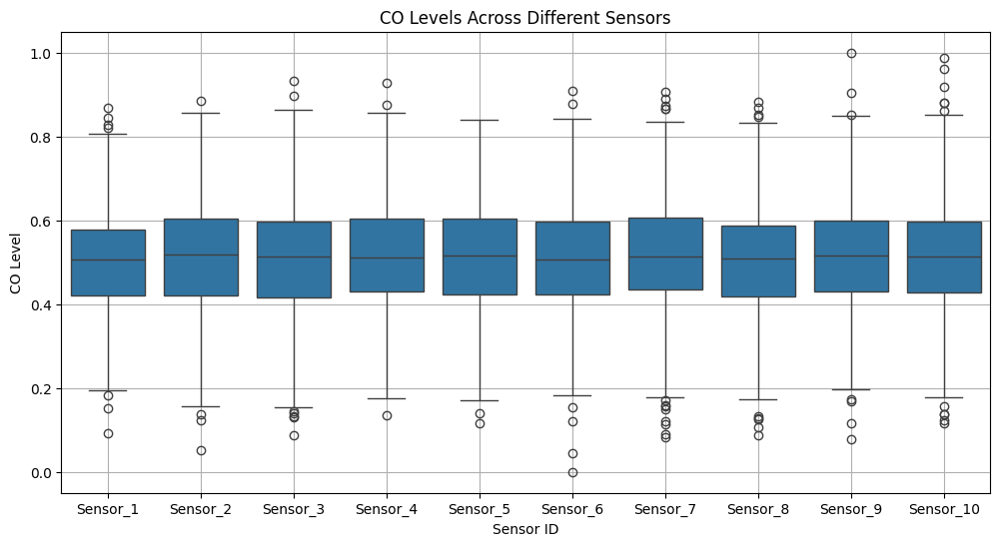

Analyzing NO2 distribution across all sensors:
Summary statistics for NO2:
Mean: 0.554630254344552
Variance: 0.015093078784539336
Skewness: -0.024084534671931314
Kurtosis: 0.0118739604759166
Min: 0.0
Max: 1.0



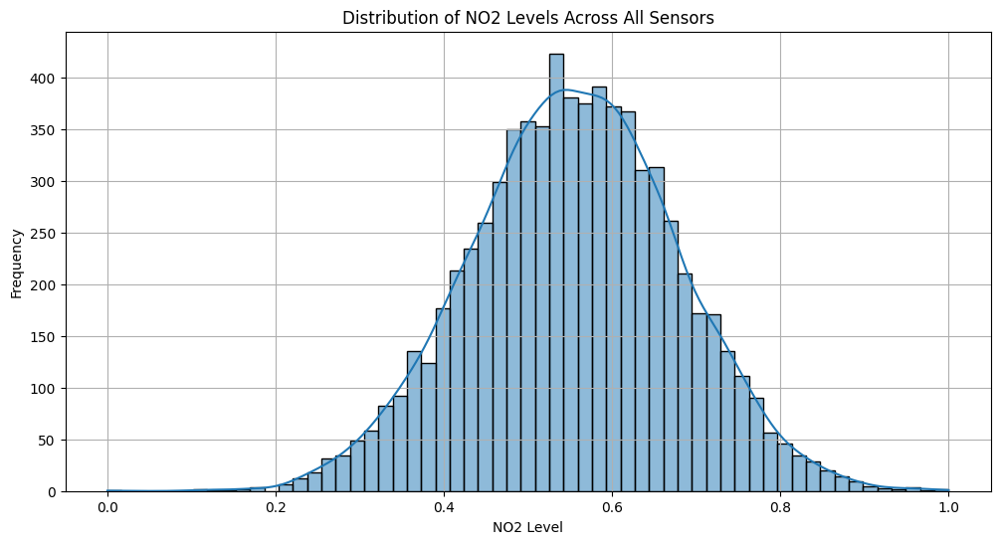

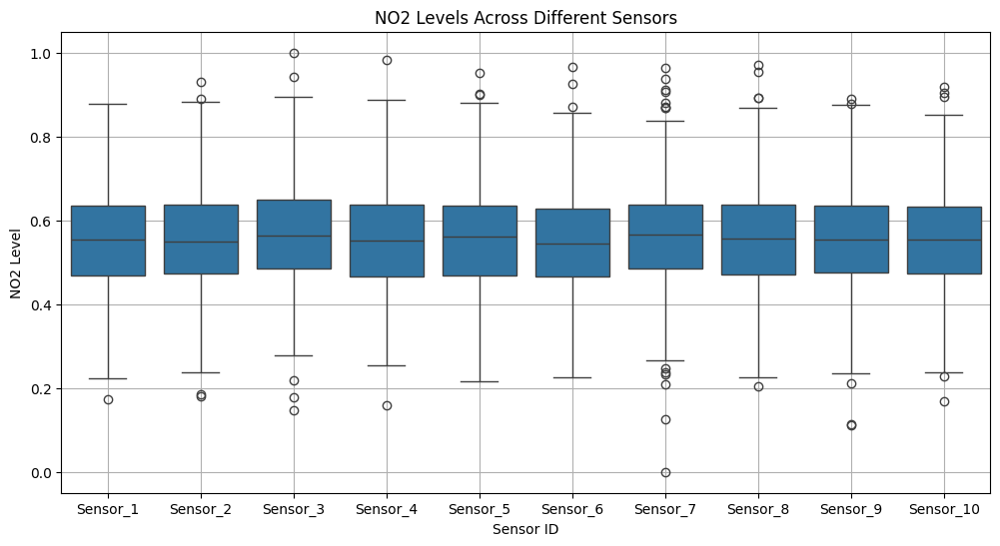

Analyzing O3 distribution across all sensors:
Summary statistics for O3:
Mean: 0.45612966125173204
Variance: 0.024921172278332352
Skewness: 0.0024006096844236997
Kurtosis: -0.04412600739619554
Min: 0.0
Max: 1.0



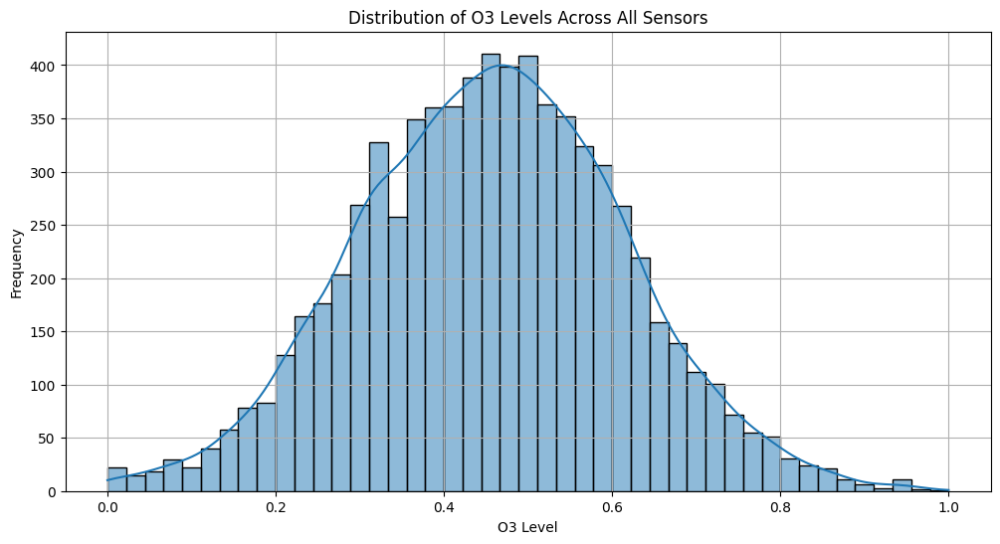

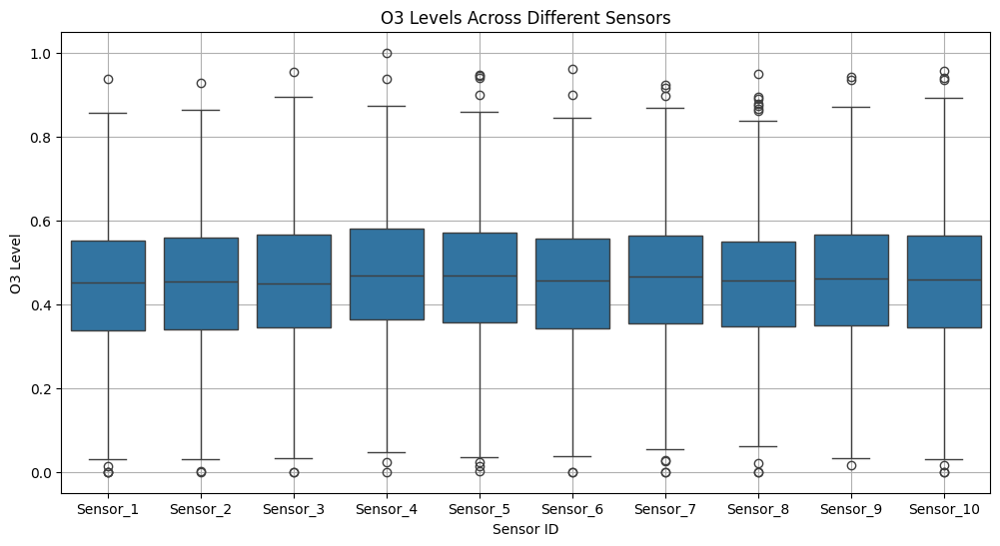

Analyzing PM10 distribution across all sensors:
Summary statistics for PM10:
Mean: 0.5129131436643153
Variance: 0.01919962005236498
Skewness: 0.04703093883409325
Kurtosis: 0.05973266554878531
Min: 0.0
Max: 1.0



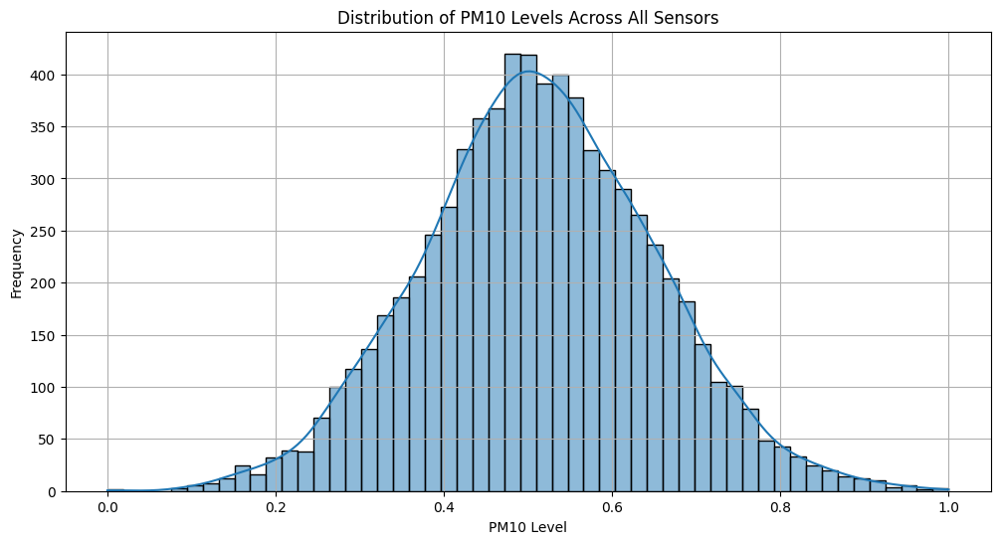

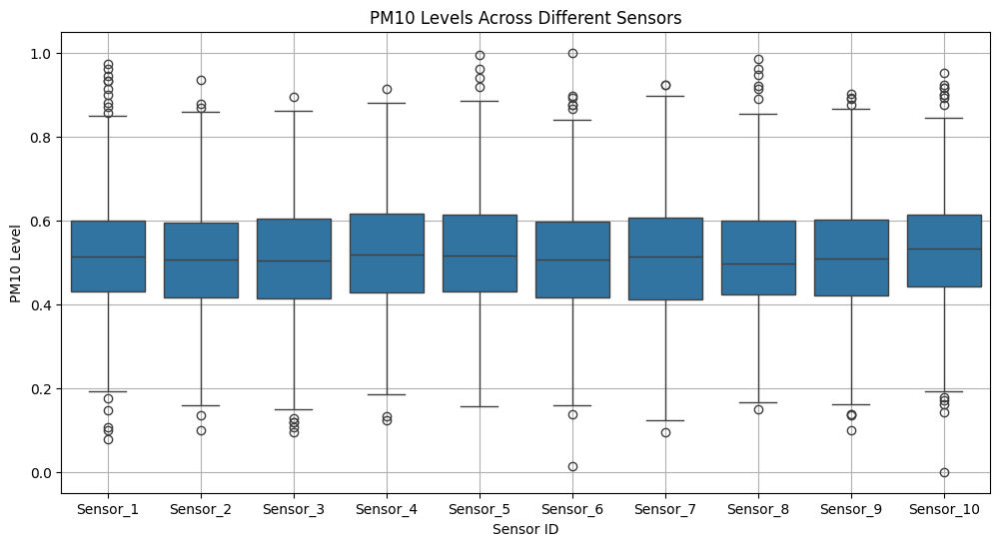

Analyzing PM2.5 distribution across all sensors:
Summary statistics for PM2.5:
Mean: 0.49387735091798124
Variance: 0.01708749202697089
Skewness: 0.02378344601402095
Kurtosis: -0.048760160478597214
Min: 0.0
Max: 1.0



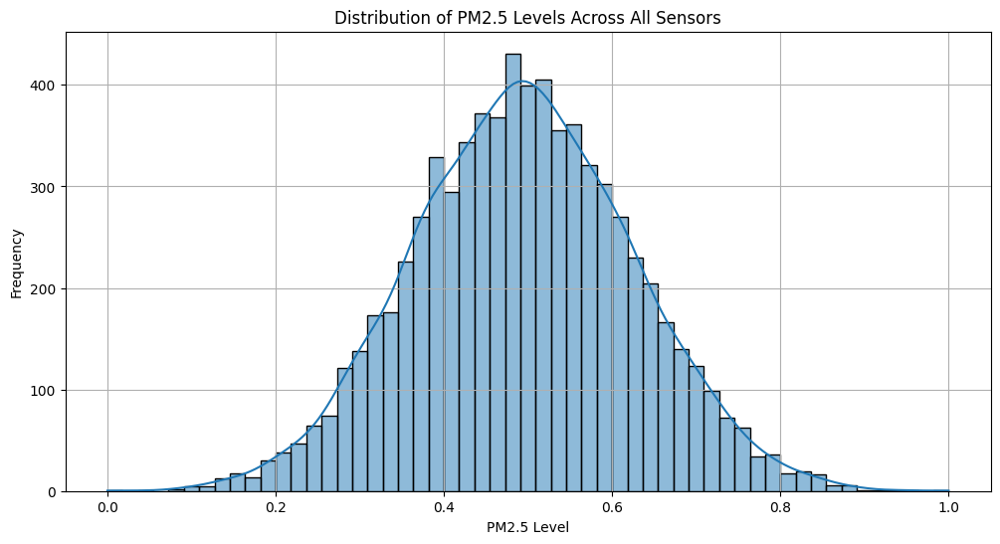

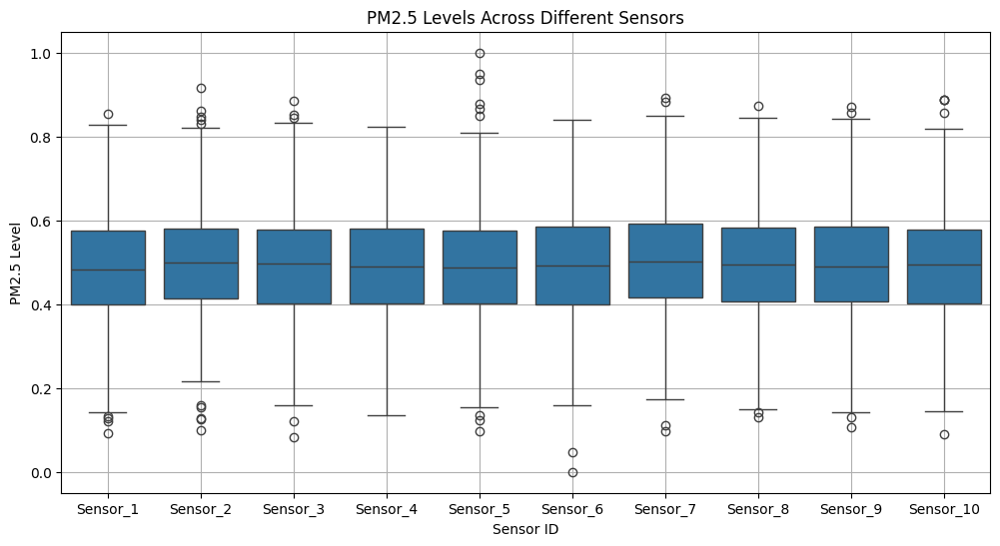

Analyzing SO2 distribution across all sensors:
Summary statistics for SO2:
Mean: 0.43836426007716517
Variance: 0.021444703298912456
Skewness: -0.009579045969650396
Kurtosis: 0.02592147985611115
Min: 0.0
Max: 1.0



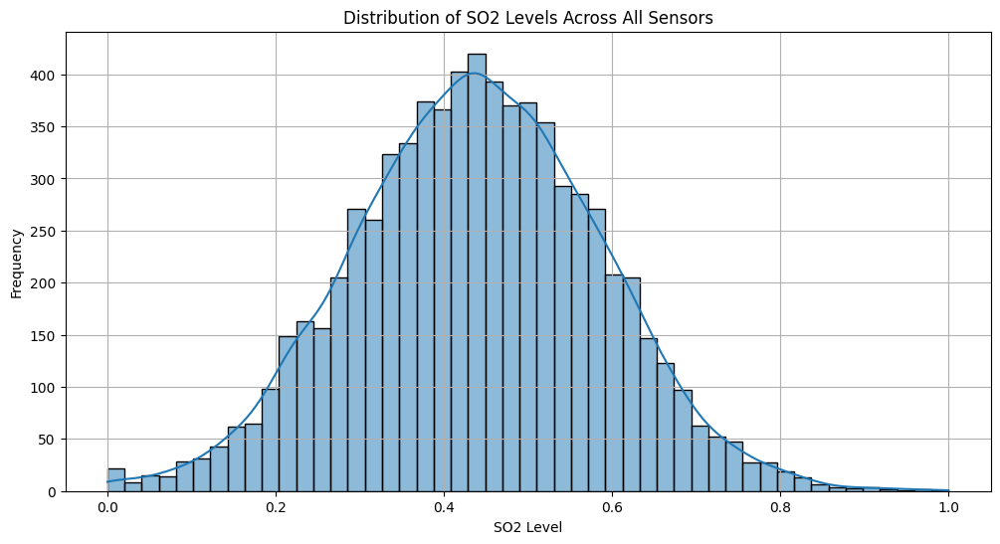

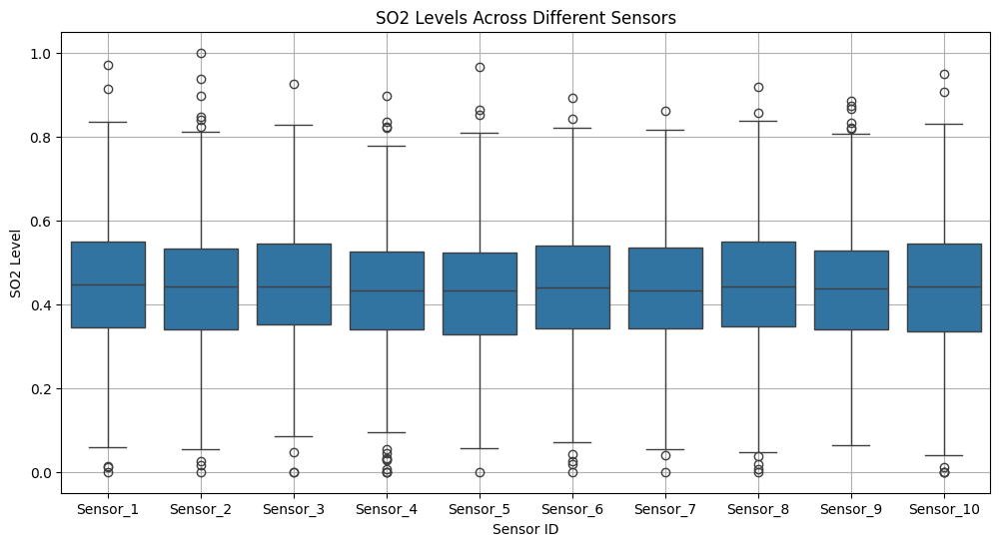

In [42]:
for pollutant in pollutants:
    print(f'Analyzing {pollutant} distribution across all sensors:')
    
    combined_data = secondary[['Sensor_ID', 'Day', pollutant]]
    
    summarize_data(combined_data, pollutant)
    
    plt.figure(figsize=(12, 6))
    sns.histplot(combined_data[pollutant], kde=True)
    plt.title(f'Distribution of {pollutant} Levels Across All Sensors')
    plt.xlabel(f'{pollutant} Level')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Sensor_ID', y=pollutant, data=combined_data)
    plt.title(f'{pollutant} Levels Across Different Sensors')
    plt.xlabel('Sensor ID')
    plt.ylabel(f'{pollutant} Level')
    plt.grid(True)
    plt.show()

Before using the rolling window, I want to first compare each pollutant's levels across all sensors. So far, we have only looked at the trends for each pollutant for each sensor. The next step is to compare the levels of each pollutant across all sensors to identify any patterns or trends. This will help us understand how the levels of each pollutant vary across different sensors and identify any outliers or unusual patterns. The easiest way to do this is to create a box plot for each pollutant and compare the levels across all sensors.

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


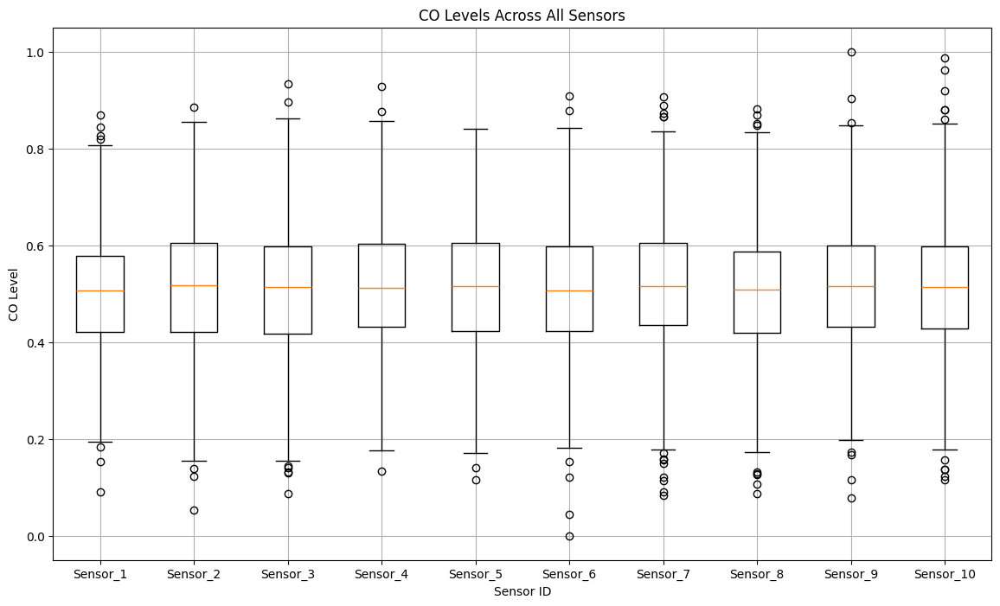

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


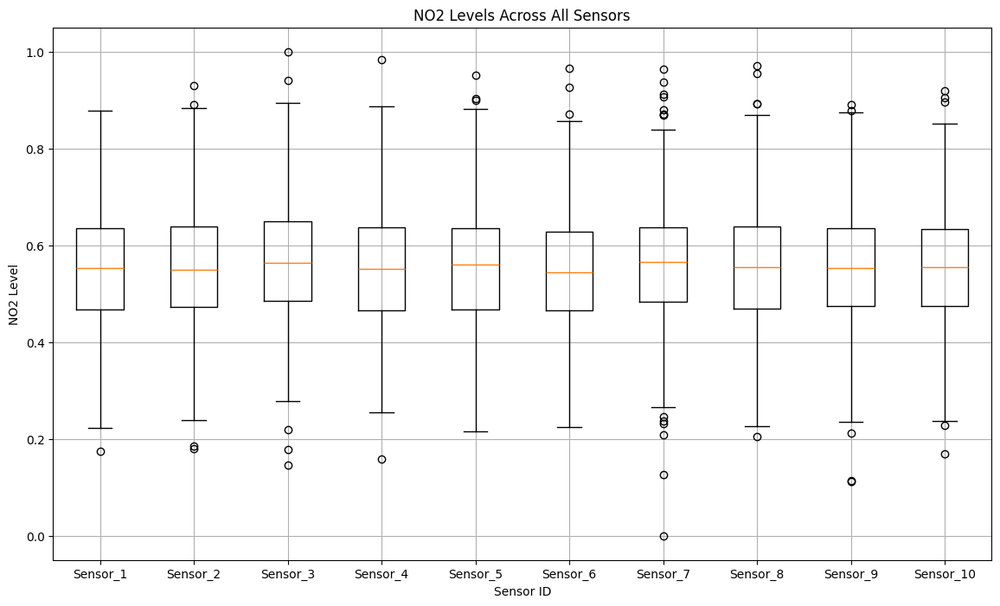

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


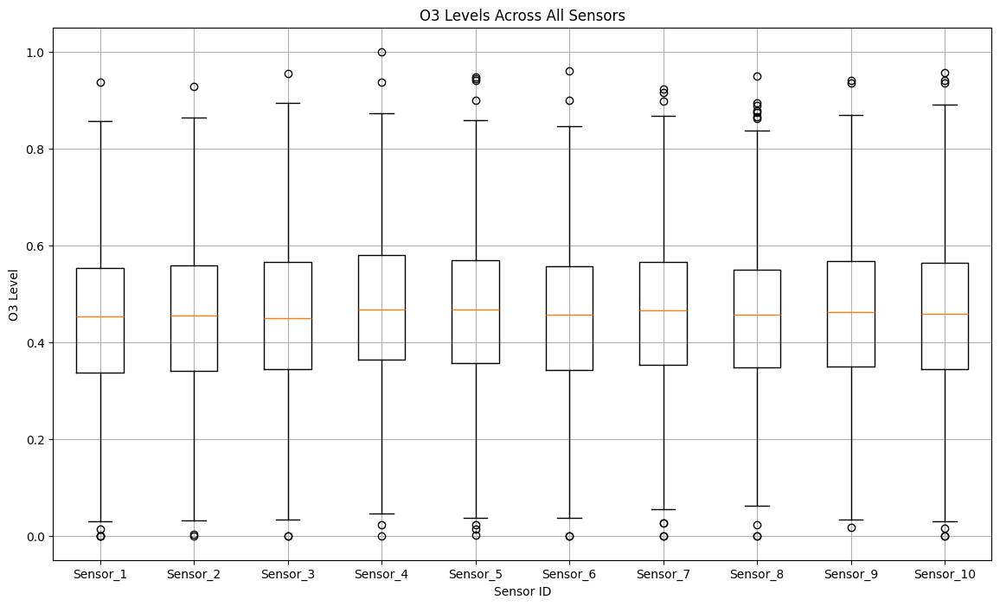

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


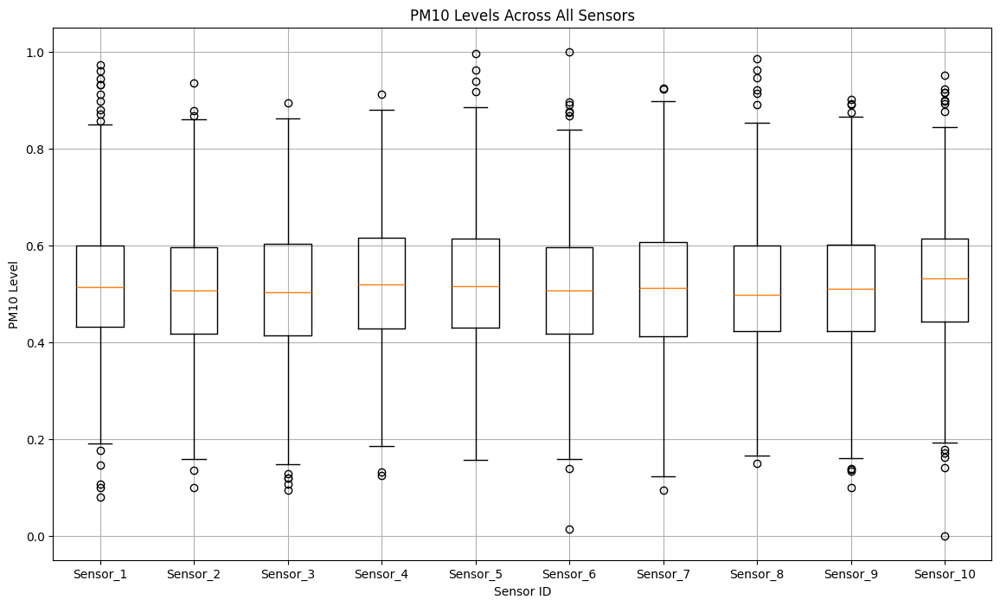

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


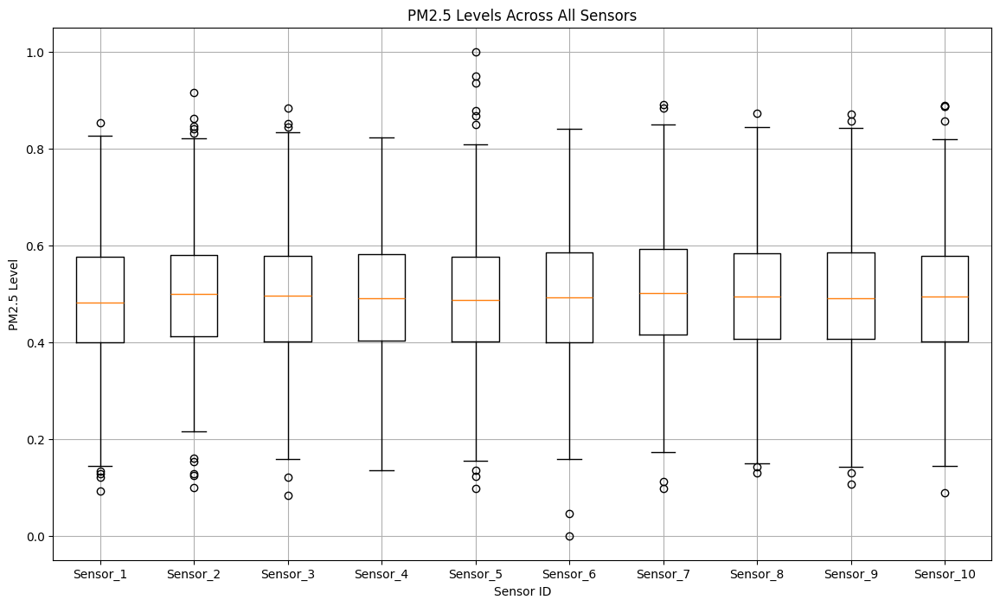

C:\Users\egale\AppData\Local\Temp\ipykernel_2588\2906870735.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=sensors)


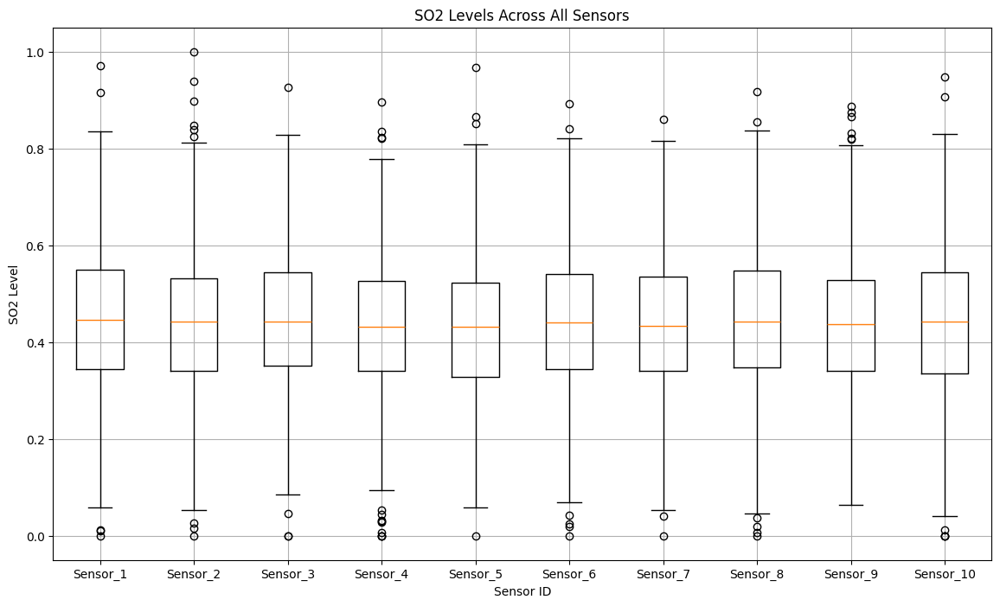

In [43]:
for pollutant in pollutants:
    plt.figure(figsize=(14, 8))
    data = []
    
    for sensor in sensors:
        sensor_data = secondary[secondary['Sensor_ID'] == sensor]
        data.append(sensor_data[pollutant])
    
    plt.boxplot(data, labels=sensors)
    
    plt.title(f'{pollutant} Levels Across All Sensors')
    plt.xlabel('Sensor ID')
    plt.ylabel(f'{pollutant} Level')
    plt.grid(True)
    
    plt.show()

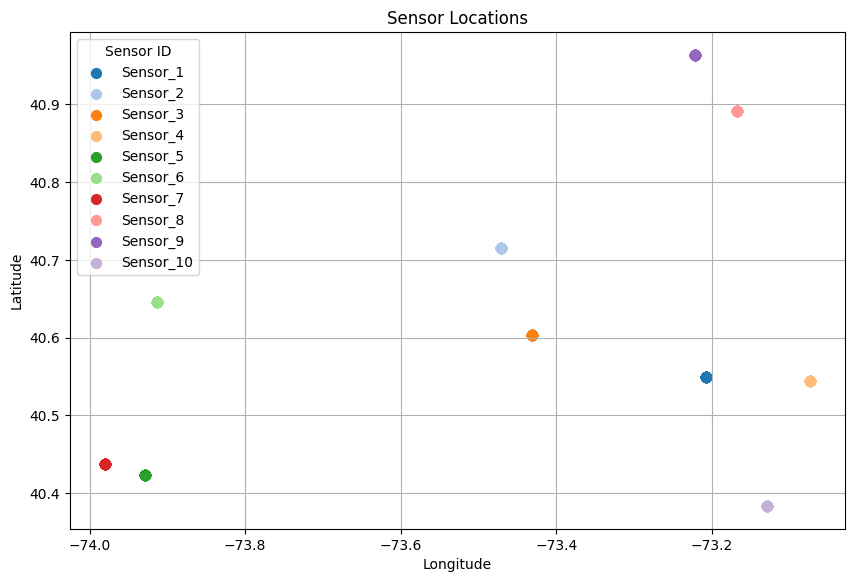

In [44]:
gdf = gpd.GeoDataFrame(secondary, geometry=gpd.points_from_xy(secondary.Longitude, secondary.Latitude))

colors = plt.cm.tab20.colors
sensor_colors = {sensor: colors[i % len(colors)] for i, sensor in enumerate(gdf['Sensor_ID'].unique())}


plt.figure(figsize=(10, 10))
ax = plt.gca()

for sensor, color in sensor_colors.items():
    sensor_data = gdf[gdf['Sensor_ID'] == sensor]
    sensor_data.plot(ax=ax, marker='o', color=color, markersize=50, label=sensor)

plt.title('Sensor Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.legend(title='Sensor ID')
plt.show()

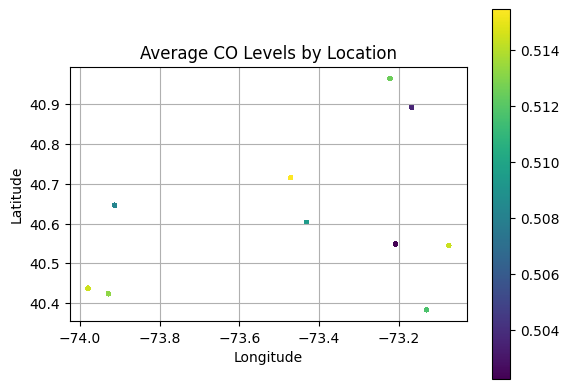

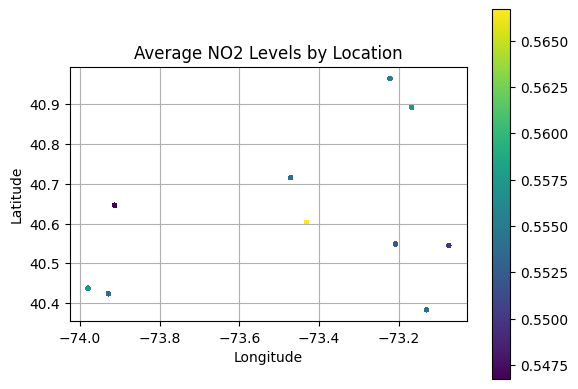

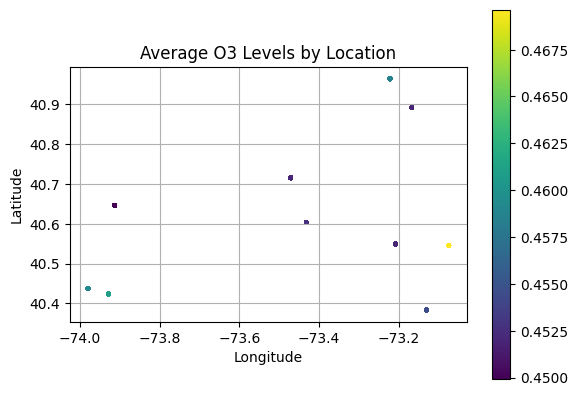

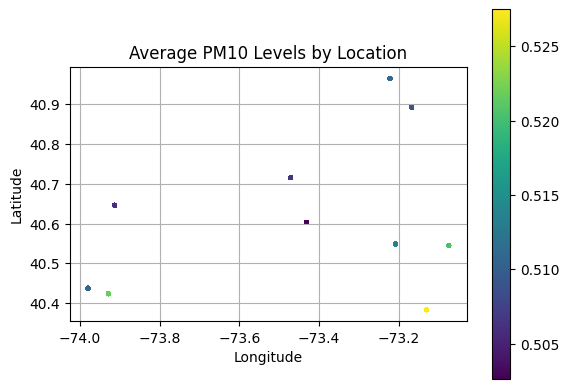

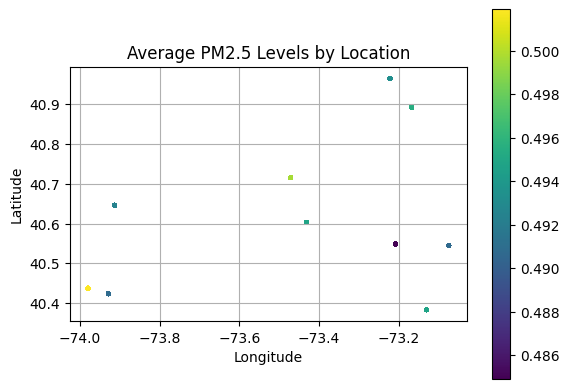

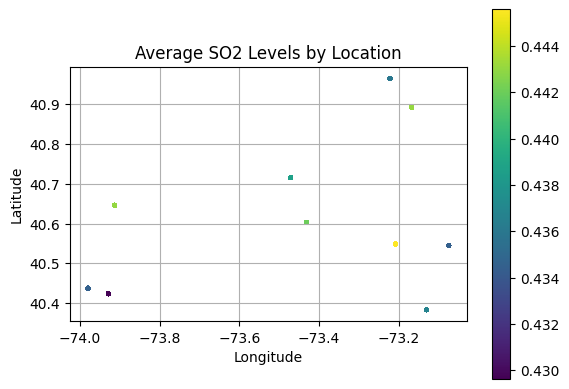

In [45]:
# gdf['avg_CO'] = gdf.groupby('Sensor_ID')['CO'].transform('mean')
# gdf.plot(column='avg_CO', cmap='viridis', legend=True, markersize=5)
# plt.title('Average CO Levels by Location')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.grid(True)
# plt.show()

for pollutant in pollutants:
    gdf[f'avg_{pollutant}'] = gdf.groupby('Sensor_ID')[pollutant].transform('mean')
    gdf.plot(column=f'avg_{pollutant}', cmap='viridis', legend=True, markersize=5)
    plt.title(f'Average {pollutant} Levels by Location')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)
    plt.show()

From the boxplots above, besides the outliers, there are no significant differences in the levels of pollutants across different sensors. This could suggest that the sensors are collecting similar data and there are no major discrepancies in the data.

In [46]:
secondary.head()

,Timestamp,Latitude,Longitude,Sensor_ID,Weather_Condition,PM2.5,PM10,NO2,SO2,CO,...,Wind_Speed,Traffic_Density,0,1,Year,Month,Day,Hour,Minute,Day_Hour
0,2024-01-01 00:00:00,40.548814,-73.208275,Sensor_1,0,0.694026,0.334507,0.514684,0.691854,0.667805,...,0.301326,-0.939097,0.0,0.0,2024,1,1,0,0,24
1,2024-01-01 01:00:00,40.548814,-73.208275,Sensor_1,0,0.468716,0.355880,0.749944,0.339096,0.553396,...,0.303700,1.371338,0.0,0.0,2024,1,1,1,0,25
2,2024-01-01 02:00:00,40.548814,-73.208275,Sensor_1,1,0.537430,0.261340,0.528815,0.427838,0.703028,...,0.401846,0.735581,1.0,0.0,2024,1,1,2,0,26
3,2024-01-01 03:00:00,40.548814,-73.208275,Sensor_1,2,0.382670,0.227528,0.459057,0.634194,0.532081,...,0.373716,-1.016628,0.0,1.0,2024,1,1,3,0,27
4,2024-01-01 04:00:00,40.548814,-73.208275,Sensor_1,2,0.157405,0.294598,0.859033,0.537615,0.647910,...,0.529954,0.851878,0.0,1.0,2024,1,1,4,0,28


In [47]:
numeric_columns = secondary.select_dtypes(include=[float, int]).columns
daily_data = secondary[numeric_columns].resample('D').mean()

pollutants = ['CO', 'NO2', 'O3', 'PM10', 'PM2.5', 'SO2']
for pollutant in pollutants:
    plt.figure(figsize=(14, 6))
    plt.plot(daily_data.index, daily_data[pollutant], label=pollutant)
    plt.title(f'{pollutant} Levels Over Time')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True)
    plt.show()

    decomposition = seasonal_decompose(daily_data[pollutant], model='additive')
    decomposition.plot()
    plt.show()

    daily_data[f'{pollutant}_MA'] = daily_data[pollutant].rolling(window=7).mean()
    plt.figure(figsize=(14, 6))
    plt.plot(daily_data.index, daily_data[pollutant], label=f'{pollutant} Original')
    plt.plot(daily_data.index, daily_data[f'{pollutant}_MA'], label=f'{pollutant} Moving Average', color='red')
    plt.title(f'{pollutant} Levels and Moving Average Over Time')
    plt.xlabel('Date')
    plt.ylabel(f'{pollutant} Level')
    plt.legend()
    plt.grid(True)
    plt.show()

    plot_acf(daily_data[pollutant].dropna(), lags=31)
    plt.title(f'Autocorrelation of {pollutant} Levels')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.grid(True)
    plt.show()

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'RangeIndex'